# S4 — Localization Scale Comparison (Single-Obs Sweep, 1800 UTC)

**Research question:** does a larger localization scale improve TEnKF analysis quality,
and does more tempering compensate for a suboptimal (too small) scale?

**Setup:**
- Assimilation time: 1800 UTC
- Ensemble size: Ne = 40
- Truth members: 60 (tm00–tm59)
- Method: **TEnKF only** (ntemp ∈ {1, 2, 3, 5})
- Localization scales compared: **0.5 km, 1.0 km, 1.5 km, 2.0 km**

**Color convention:** red = 0.5 km, orange = 1.0 km, green = 1.5 km, blue = 2.0 km  
**Line style convention:** solid = Nt=1, dashed = Nt=2, dotted = Nt=3, dash-dot = Nt=5

In [1]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({
    'figure.dpi': 130,
    'font.size': 10,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'legend.fontsize': 8,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
})

LOC_SCALES = [0.5, 1.0, 1.5, 2.0,2.5,3.0,3.5,4.0,4.5,5.0]
LOC_COLORS = {0.5: '#d62728', 1.0: '#ff7f0e', 1.5: '#2ca02c', 2.0: '#1f77b4',2.5: '#9467bd', 3.0: '#8c564b', 3.5: '#e377c2', 4.0: '#7f7f7f', 4.5: '#bcbd22', 5.0: '#17becf'}
LOC_LABELS = {l: f'loc = {l} km' for l in LOC_SCALES}

COMMON_NTEMP  = [1, 2, 3, 5]
NTEMP_STYLES  = {1: '-', 2: '--', 3: ':', 5: '-.'}
NTEMP_MARKERS = {1: 'o', 2: 's', 3: '^', 5: 'D'}

print('Imports and palettes ready.')

Imports and palettes ready.


In [2]:
# ============================================================
# HELPER FUNCTIONS
# ============================================================

def load_sweep_npz(path):
    """Load one NPZ into a DataFrame, skipping var_names and non-1D arrays."""
    d = np.load(path, allow_pickle=True)
    cols = [k for k in d.files if d[k].ndim == 1 and k != 'var_names']
    return pd.DataFrame({k: d[k] for k in cols})


def add_derived_cols(df):
    """Add dRMSE convenience columns for all metrics and state variables."""
    # Original reflectivity-obs columns (kept for backward compatibility)
    df['drmse_w'] = df['rmse_a_w_obs'] - df['rmse_f_w_obs']
    df['drmse_u'] = df['rmse_a_u_obs'] - df['rmse_f_u_obs']
    df['drmse_point'] = df['rmse_a_point_obs'] - df['rmse_f_point_obs']

    # Per-variable dRMSE for all three metric types
    STATE_VARS = ['obs', 'qg', 'qr', 'qs', 'T', 'P', 'u', 'v', 'w']
    ALL_METRICS = ['w', 'u', 'point']
    for metric in ALL_METRICS:
        for v in STATE_VARS:
            col_f = f'rmse_f_{metric}_{v}'
            col_a = f'rmse_a_{metric}_{v}'
            if col_f in df.columns and col_a in df.columns:
                df[f'drmse_{metric}_{v}'] = df[col_a] - df[col_f]
    return df


def scatter_to_grid_xy(x_km, y_km, values, bins=80):
    """Bin scattered (x, y, value) onto a regular 2D grid. Returns x_edges, y_edges, grid."""
    x_edges = np.linspace(np.nanmin(x_km), np.nanmax(x_km), bins + 1)
    y_edges = np.linspace(np.nanmin(y_km), np.nanmax(y_km), bins + 1)
    acc = np.zeros((bins, bins))
    cnt = np.zeros((bins, bins))
    xi = np.clip(np.digitize(x_km, x_edges) - 1, 0, bins - 1)
    yi = np.clip(np.digitize(y_km, y_edges) - 1, 0, bins - 1)
    for ix, iy, v in zip(xi, yi, values):
        if not np.isnan(v):
            acc[ix, iy] += v
            cnt[ix, iy] += 1
    grid = np.where(cnt > 0, acc / cnt, np.nan)
    return x_edges, y_edges, grid.T


def binned_stats(x, y, edges):
    """Return (centers, means, stds) for y binned by x using the given edges."""
    centers = 0.5 * (edges[:-1] + edges[1:])
    n = len(centers)
    means = np.full(n, np.nan)
    stds  = np.full(n, np.nan)
    for b in range(n):
        mask = (x >= edges[b]) & (x < edges[b + 1]) & ~np.isnan(y)
        if mask.sum() >= 10:
            means[b] = np.nanmean(y[mask])
            stds[b]  = np.nanstd(y[mask])
    return centers, means, stds


print('Helper functions loaded.')

Helper functions loaded.


## S0. Localization Coverage: Grid Points within Cutoff Zone

How many grid points does each observation "see" for different localization scales?

Loads only `pos_km` from the forecast file (no ensemble needed — this geometry is fixed).
A point is included iff `(Δx/lx)² + (Δy/ly)² + (Δz/lz)² ≤ (2√(10/3))² ≈ 13.33`
(same formula as `_compute_rho` in `src/runners/run_experiment.py`).

Points are split into **above** / **same level** / **below** the observation to diagnose
vertical asymmetry due to the non-uniform z grid: `[0.25, 0.5, 1, 2, 3, 4, 5, 6, 8, 10, 12 km]`.

In [3]:
# ============================================================
# S0. Localization Coverage: Grid Points within GC Cutoff Zone
# (no ensemble needed — purely geometric, loads pos_km only)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker

SUBSET_FILE = (
    '/home/jorge.gacitua/datosmunin/WRF_Single_Cycle_Assimilation/data/'
    '3D_subsets_20240319_GUES_20240319180000/subset_20240319180000.npz'
)
subset = np.load(SUBSET_FILE)
pos_km = subset['pos_km']              # (nx, ny, nz, 3)  — x_km, y_km, z_km
nx, ny, nz = pos_km.shape[:3]

# Same cutoff as _compute_rho in src/runners/run_experiment.py:222
D2_CUTOFF = (2.0 * np.sqrt(10.0 / 3.0)) ** 2    # ≈ 13.33
R_CUT     = np.sqrt(D2_CUTOFF)                    # effective radius factor ≈ 3.65

# ── representative observation: domain centre ────────────────────────────────
i0, j0  = nx // 2, ny // 2
z_lev   = pos_km[i0, j0, :, 2]                   # (nz,) in km
dx_grid = float(pos_km[1, 0, 0, 0] - pos_km[0, 0, 0, 0])
dy_grid = float(pos_km[0, 1, 0, 1] - pos_km[0, 0, 0, 1])

# Pre-compute horizontal displacement from obs (independent of lz / k0)
dxg = pos_km[:, :, 0, 0] - float(pos_km[i0, j0, 0, 0])   # (nx, ny)
dyg = pos_km[:, :, 0, 1] - float(pos_km[i0, j0, 0, 1])   # (nx, ny)

print(f"Grid: {nx}×{ny}×{nz}  |  Δx≈{dx_grid:.2f} km  Δy≈{dy_grid:.2f} km")
print(f"Vertical levels (km): {z_lev}")
print(f"GC cutoff: D² ≤ {D2_CUTOFF:.3f}  →  radius = loc × {R_CUT:.3f} km")
print()
print(f"At lx=ly=0.5 km → horiz. cutoff radius = {0.5*R_CUT:.2f} km  (grid spacing {dx_grid:.2f} km)")
print(f"  → for lx=ly=0.5, the nearest horizontal neighbour is {dx_grid:.2f} km away → OUTSIDE cutoff")


def count_cutoff(lx, ly, lz, k0):
    """Total / above / same-level / below counts in GC ellipsoid around (i0,j0,k0)."""
    dxy2 = (dxg / lx)**2 + (dyg / ly)**2                          # (nx, ny)
    dz   = z_lev - z_lev[k0]                                       # (nz,)
    dz2  = (dz / lz)**2
    d2   = dxy2[:, :, np.newaxis] + dz2[np.newaxis, np.newaxis, :] # (nx, ny, nz)
    in_c = d2 <= D2_CUTOFF
    dz3  = dz[np.newaxis, np.newaxis, :]
    return (int(in_c.sum()),
            int((in_c & (dz3 > 0)).sum()),
            int((in_c & (dz3 == 0)).sum()),
            int((in_c & (dz3 < 0)).sum()))


# ── compute isotropic results for all scales and levels ─────────────────────
iso_res = {
    loc: [count_cutoff(loc, loc, loc, k) for k in range(nz)]
    for loc in LOC_SCALES
}




Grid: 558×898×11  |  Δx≈1.98 km  Δy≈1.98 km
Vertical levels (km): [ 0.25  0.5   1.    2.    3.    4.    5.    6.    8.   10.   12.  ]
GC cutoff: D² ≤ 13.333  →  radius = loc × 3.651 km

At lx=ly=0.5 km → horiz. cutoff radius = 1.83 km  (grid spacing 1.98 km)
  → for lx=ly=0.5, the nearest horizontal neighbour is 1.98 km away → OUTSIDE cutoff


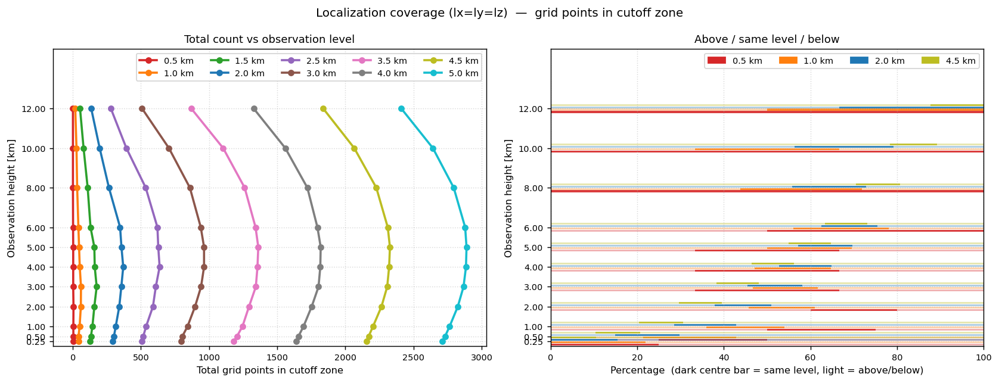

In [4]:
# ── Figure 1: isotropic total count + vertical breakdown ────────────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle('Localization coverage (lx=ly=lz)  —  grid points in cutoff zone',
             fontsize=11)

# Left: n_total vs obs height, one line per scale
ax = axes[0]
for loc in LOC_SCALES:
    n_tot = [iso_res[loc][k][0] for k in range(nz)]
    ax.plot(n_tot, z_lev, marker='o', color=LOC_COLORS[loc],
            linewidth=2, markersize=5, label=f'{loc} km')
ax.set_xlabel('Total grid points in cutoff zone')
ax.set_ylabel('Observation height [km]')
ax.set_title('Total count vs observation level')
ax.set_ylim(0,15)
ax.set_yticks(z_lev)
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
ax.legend(fontsize=8, ncol=5)
ax.grid(True, linestyle=':', alpha=0.5)

# Right: above / same / below breakdown for selected scales, all levels
ax = axes[1]
sel = [0.5, 1.0, 2.0, 4.5]
bh  = 0.12
offs = np.linspace(-(len(sel)-1)/2, (len(sel)-1)/2, len(sel)) * bh

for oi, loc in enumerate(sel):
    n_ab   = np.array([iso_res[loc][k][1] for k in range(nz)], float)
    n_same = np.array([iso_res[loc][k][2] for k in range(nz)], float)
    n_bl   = np.array([iso_res[loc][k][3] for k in range(nz)], float)
    total = n_ab + n_same + n_bl
    #percentage
    n_ab = n_ab / total * 100
    n_same = n_same / total * 100
    n_bl = n_bl / total * 100
    
    y  = z_lev + offs[oi]
    c  = LOC_COLORS[loc]
    ax.barh(y, n_bl,   height=bh*0.8, color=c, alpha=0.35, left=0)
    ax.barh(y, n_same, height=bh*0.8, color=c, alpha=0.90, left=n_bl,
            label=f'{loc} km')
    ax.barh(y, n_ab,   height=bh*0.8, color=c, alpha=0.35, left=n_bl+n_same)

legend_col = [mpatches.Patch(color=LOC_COLORS[l], label=f'{l} km') for l in sel]
#legend_alp = [mpatches.Patch(facecolor='grey', alpha=0.35, label='above / below'),
#              mpatches.Patch(facecolor='grey', alpha=0.90, label='same z-level')]
ax.legend(handles=legend_col, fontsize=8, ncol=4)
ax.set_xlabel('Percentage  (dark centre bar = same level, light = above/below)')
ax.set_ylabel('Observation height [km]')
ax.set_title('Above / same level / below')
ax.set_yticks(z_lev)
ax.set_ylim(0,15)
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
ax.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

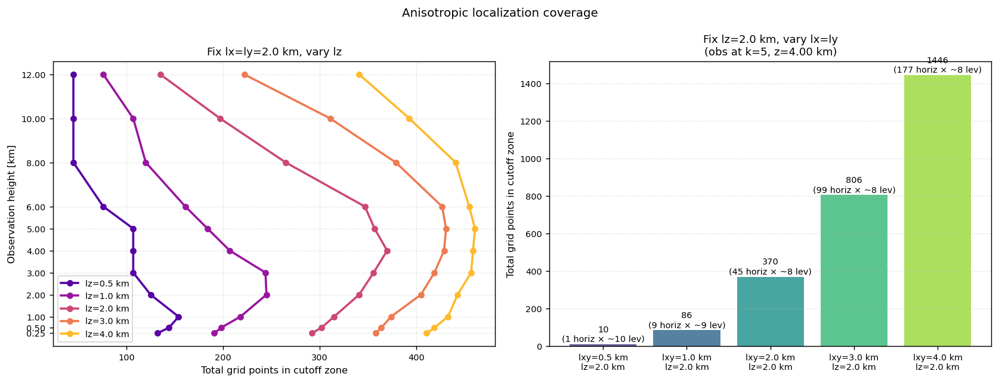

In [5]:


# ── Figure 2: anisotropic — vary lz or lxy independently ────────────────────
LXY_REF, LZ_REF = 2.0, 2.0
lz_sweep  = [0.5, 1.0, 2.0, 3.0, 4.0]
lxy_sweep = [0.5, 1.0, 2.0, 3.0, 4.0]
cmap_lz  = plt.cm.plasma(np.linspace(0.15, 0.85, len(lz_sweep)))
cmap_lxy = plt.cm.viridis(np.linspace(0.15, 0.85, len(lxy_sweep)))

# Pre-compute anisotropic results
aniso_lz = {lz: [count_cutoff(LXY_REF, LXY_REF, lz, k) for k in range(nz)]
             for lz in lz_sweep}
k_mid = nz // 2
aniso_lxy_n = {lxy: count_cutoff(lxy, lxy, LZ_REF, k_mid) for lxy in lxy_sweep}
n_horiz_all = {lxy: int(((dxg/lxy)**2 + (dyg/lxy)**2 <= D2_CUTOFF).sum())
               for lxy in lxy_sweep}

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle('Anisotropic localization coverage', fontsize=11)

# Left: fix lxy=2, vary lz
ax = axes[0]
for ci, lz in enumerate(lz_sweep):
    n_tot = [aniso_lz[lz][k][0] for k in range(nz)]
    ax.plot(n_tot, z_lev, marker='o', color=cmap_lz[ci],
            linewidth=2, markersize=5, label=f'lz={lz} km')
ax.set_xlabel('Total grid points in cutoff zone')
ax.set_ylabel('Observation height [km]')
ax.set_title(f'Fix lx=ly={LXY_REF} km, vary lz')
ax.set_yticks(z_lev)
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
ax.legend(fontsize=8)
ax.grid(True, linestyle=':', alpha=0.5)

# Right: fix lz=2, vary lxy — bar chart at k_mid
ax = axes[1]
bar_x = np.arange(len(lxy_sweep))
n_vals = [aniso_lxy_n[lxy][0] for lxy in lxy_sweep]
n_h    = [n_horiz_all[lxy] for lxy in lxy_sweep]
n_v    = [aniso_lxy_n[lxy][0] // n_horiz_all[lxy] if n_horiz_all[lxy] > 0 else 0
          for lxy in lxy_sweep]

bars = ax.bar(bar_x, n_vals, color=[cmap_lxy[i] for i in range(len(lxy_sweep))], alpha=0.82)
for xi, (lxy, nt, nh) in enumerate(zip(lxy_sweep, n_vals, n_h)):
    nz_eff = nt // nh if nh > 0 else 0
    ax.text(xi, nt + max(n_vals)*0.01,
            f'{nt}\n({nh} horiz × ~{nz_eff} lev)', ha='center', fontsize=8)
ax.set_xticks(bar_x)
ax.set_xticklabels([f'lxy={l} km\nlz={LZ_REF} km' for l in lxy_sweep])
ax.set_ylabel('Total grid points in cutoff zone')
ax.set_title(f'Fix lz={LZ_REF} km, vary lx=ly\n(obs at k={k_mid}, z={z_lev[k_mid]:.2f} km)')
ax.grid(True, linestyle=':', alpha=0.5, axis='y')

plt.tight_layout()
plt.show()



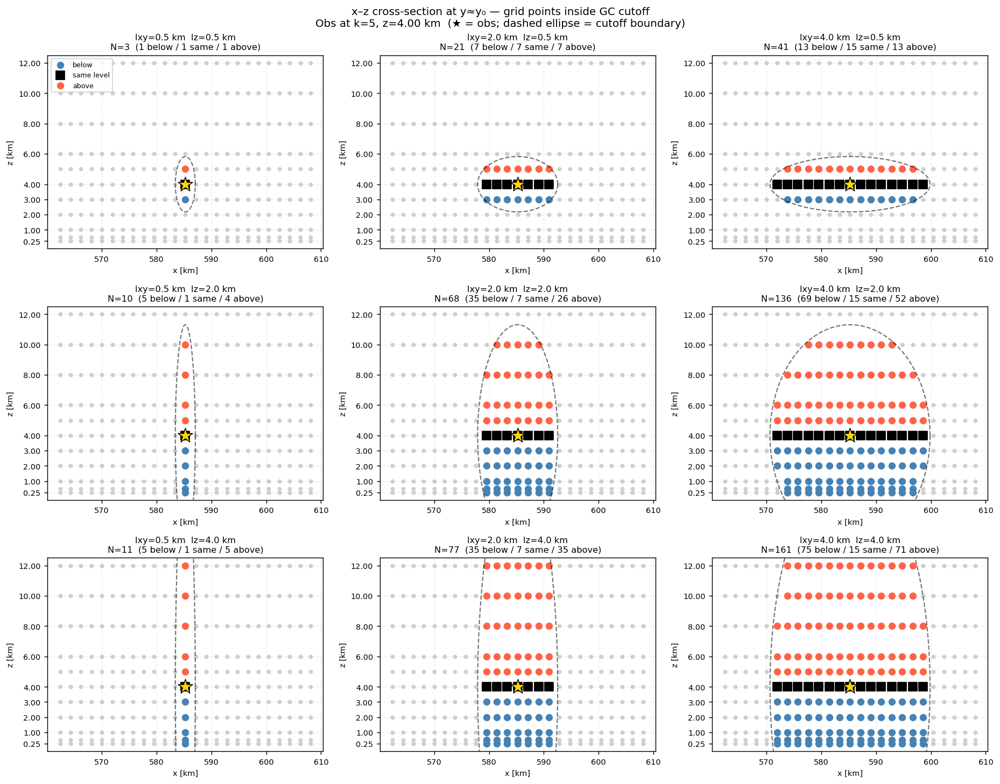


── Isotropic: n_total (lx=ly=lz) ──────────────────────────────────
   z_obs      0.5    1.0    1.5    2.0    2.5    3.0    3.5    4.0    4.5    5.0
────────────────────────────────────────────────────────────────────────────────
    0.25        4     41    127    292    505    796   1181   1641   2155   2710     [above: 3 32 247 1464 | below: 0 0 0 0] (for lx=0.5/1/2/4)
    0.50        4     42    133    302    517    804   1205   1656   2171   2732     [above: 2 24 212 1302 | below: 1 9 45 177] (for lx=0.5/1/2/4)
    1.00        4     50    144    315    538    842   1245   1693   2203   2765     [above: 1 23 180 1162 | below: 2 18 90 354] (for lx=0.5/1/2/4)
    2.00        5     59    158    341    588    897   1293   1753   2265   2825     [above: 1 23 167 1045 | below: 3 27 129 531] (for lx=0.5/1/2/4)
    3.00        3     60    175    356    609    941   1343   1803   2307   2867     [above: 1 23 149 928 | below: 1 28 162 698] (for lx=0.5/1/2/4)
    4.00        3     51    161  

In [6]:

# ── Figure 3: x–z cross-section for selected anisotropic configurations ─────
lz_show  = [0.5, 2.0, 4.0]
lxy_show = [0.5, 2.0, 4.0]
k_obs    = nz // 2                         # observation level for cross-section
win      = 12                              # ±12 grid pts from centre (~24 km window)
i_range  = np.arange(max(0, i0-win), min(nx, i0+win+1))

# Extract x-z cross-section at j=j0
xc = pos_km[i_range, j0, :, 0]            # (len(i_range), nz) x in km
zc = pos_km[i_range, j0, :, 2]            # (len(i_range), nz) z in km
x0c = float(pos_km[i0, j0, k_obs, 0])
z0c = float(z_lev[k_obs])

fig, axes = plt.subplots(len(lz_show), len(lxy_show),
                          figsize=(4.8*len(lxy_show), 3.8*len(lz_show)))
fig.suptitle(
    f'x–z cross-section at y≈y₀ — grid points inside GC cutoff\n'
    f'Obs at k={k_obs}, z={z0c:.2f} km  (★ = obs; dashed ellipse = cutoff boundary)',
    fontsize=11)

theta = np.linspace(0, 2*np.pi, 300)

for ri, lz in enumerate(lz_show):
    for ci, lxy in enumerate(lxy_show):
        ax = axes[ri][ci]

        # Normalized d² restricted to y=y0 column (dy=0)
        dx_n = (xc - x0c) / lxy
        dz_n = (zc - z0c) / lz
        d2   = dx_n**2 + dz_n**2
        in_c = d2 <= D2_CUTOFF

        # Colour by position relative to obs
        above = zc > z0c
        below = zc < z0c

        ax.scatter(xc[~in_c], zc[~in_c], c='#d0d0d0', s=20, zorder=1, linewidths=0)
        ax.scatter(xc[in_c & below], zc[in_c & below],
                   c='steelblue', s=55, zorder=2, linewidths=0, label='below')
        ax.scatter(xc[in_c & ~above & ~below], zc[in_c & ~above & ~below],
                   c='black', s=75, zorder=3, marker='s', label='same level')
        ax.scatter(xc[in_c & above], zc[in_c & above],
                   c='tomato', s=55, zorder=2, linewidths=0, label='above')
        ax.scatter([x0c], [z0c], marker='*', c='gold', s=250,
                   edgecolors='black', linewidths=0.8, zorder=5)

        # Dashed ellipse outline (exact GC boundary in x-z slice at y=y0)
        ell_x = x0c + lxy * R_CUT * np.cos(theta)
        ell_z = z0c + lz  * R_CUT * np.sin(theta)
        ax.plot(ell_x, ell_z, 'k--', linewidth=1.2, alpha=0.55, zorder=4)

        n_in = int(in_c.sum())
        n_ab = int((in_c & above).sum())
        n_bl = int((in_c & below).sum())
        ax.set_title(f'lxy={lxy} km  lz={lz} km\nN={n_in}  ({n_bl} below / {n_in-n_ab-n_bl} same / {n_ab} above)',
                     fontsize=9)
        ax.set_xlabel('x [km]', fontsize=8)
        ax.set_ylabel('z [km]', fontsize=8)
        ax.set_yticks(z_lev)
        ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
        ax.grid(True, linestyle=':', alpha=0.4)
        if ri == 0 and ci == 0:
            ax.legend(fontsize=7, loc='upper left')
        ax.set_ylim(z_lev[0] - 0.5, z_lev[-1] + 0.5)
        ax.set_yticks([0.25,1,2,3,4,6,8,10,12])

plt.tight_layout()
plt.show()


# ── Summary table ────────────────────────────────────────────────────────────
print('\n── Isotropic: n_total (lx=ly=lz) ──────────────────────────────────')
header = f"{'z_obs':>8}  " + ''.join(f'{l:>7.1f}' for l in LOC_SCALES)
print(header)
print('─' * len(header))
for k in range(nz):
    row = f"{z_lev[k]:>8.2f}  "
    row += ''.join(f'{iso_res[l][k][0]:>7d}' for l in LOC_SCALES)
    row += f"     [above: " + ' '.join(f'{iso_res[l][k][1]}' for l in [0.5,1.0,2.0,4.0]) + \
           f" | below: " + ' '.join(f'{iso_res[l][k][3]}' for l in [0.5,1.0,2.0,4.0]) + \
           f"] (for lx=0.5/1/2/4)"
    print(row)
print(f'\nVertical level spacing (km): {np.diff(z_lev).round(3)}')

## S0b. Localization Weight Magnitude in the x–z Cross-Section

The binary in/out view above only shows which points are *inside* the cutoff ellipsoid.
Here we compute the actual Gaussian weight at each point:

$$w = \exp\!\left(-\tfrac{1}{2}\,d^2\right) \quad d^2 = \left(\frac{\Delta x}{l}\right)^2 + \left(\frac{\Delta z}{l}\right)^2$$

At the observation location $w=1$; at the cutoff boundary $d^2 \approx 13.33 \Rightarrow w \approx 0.001$.
This reveals that a larger scale adds many grid points but with near-zero influence.

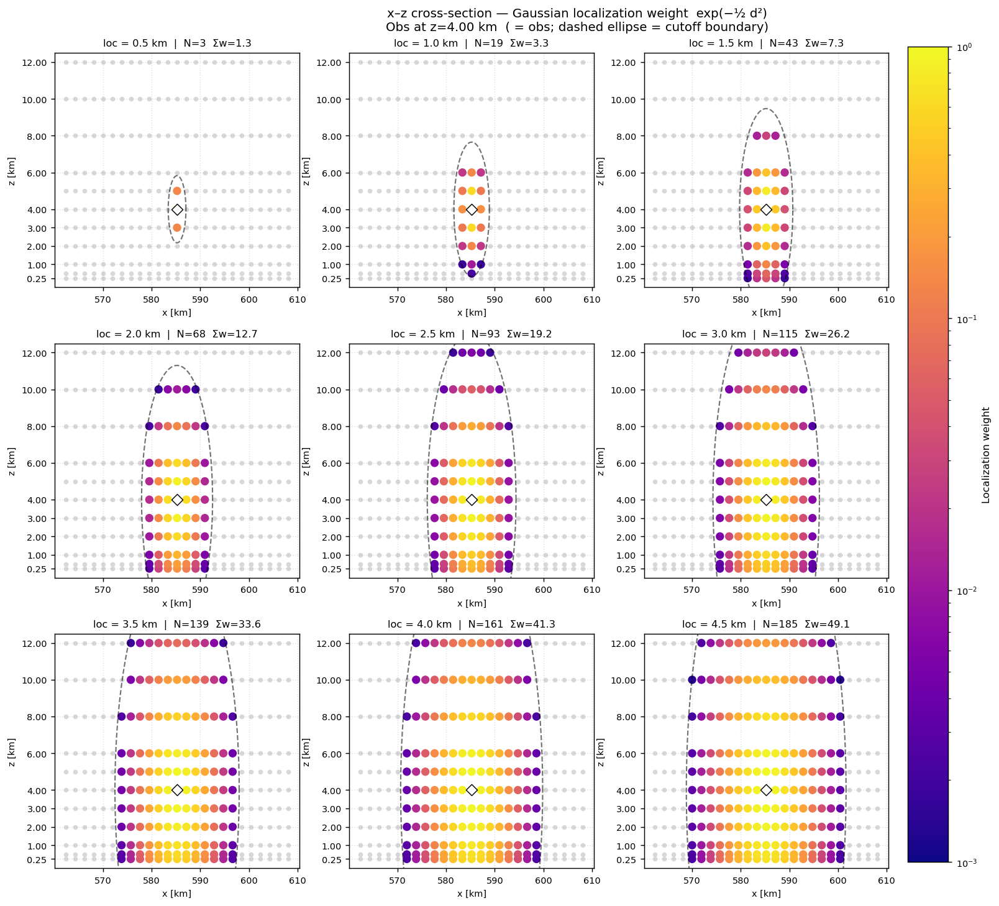

In [7]:
# ── Figure 5: x-z cross-sections coloured by actual Gaussian weight ──────────
# weight = exp(-0.5 * d²)  inside cutoff,
# Same formula as _compute_rho in src/runners/run_experiment.py:212-223

import matplotlib.colors as mcolors

l_show_w = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5]
k_obs     = nz // 2
win       = 12
i_range_w = np.arange(max(0, i0 - win), min(nx, i0 + win + 1))

xc_w  = pos_km[i_range_w, j0, :, 0]   # (n_x, nz)  x in km
zc_w  = pos_km[i_range_w, j0, :, 2]
x0c_w = float(pos_km[i0, j0, k_obs, 0])
z0c_w = float(z_lev[k_obs])
theta  = np.linspace(0, 2 * np.pi, 300)
#logaritmic scale for weights to enhance visibility of low values
cmap_w = plt.cm.plasma
norm_w = mcolors.LogNorm(vmin=1e-3, vmax=1)

fig, axes = plt.subplots(3, 3, figsize=(4.8 * 3, 3.8 * 3))
fig.suptitle(
    'x–z cross-section — Gaussian localization weight  exp(−½ d²)\n'
    f'Obs at z={z0c_w:.2f} km  ( = obs; dashed ellipse = cutoff boundary)',
    fontsize=11)
axes_flat = axes.flatten()

for ri, l in enumerate(l_show_w):
    ax = axes_flat[ri]

    dx_n = (xc_w - x0c_w) / l
    dz_n = (zc_w - z0c_w) / l
    d2   = dx_n ** 2 + dz_n ** 2
    w    = np.where(d2 <= D2_CUTOFF, np.exp(-0.5 * d2), np.nan)

    mask_out = d2 > D2_CUTOFF
    ax.scatter(xc_w[mask_out], zc_w[mask_out],
               c='#d8d8d8', s=18, zorder=1, linewidths=0)

    mask_in = ~mask_out
    sc = ax.scatter(xc_w[mask_in], zc_w[mask_in],
                    c=w[mask_in], cmap=cmap_w, norm=norm_w,
                    s=55, zorder=2, linewidths=0)

    ax.scatter([x0c_w], [z0c_w], marker='D', c='white', s=50,
               edgecolors='black', linewidths=0.8, zorder=5)

    ell_x = x0c_w + l * R_CUT * np.cos(theta)
    ell_z = z0c_w + l * R_CUT * np.sin(theta)
    ax.plot(ell_x, ell_z, 'k--', linewidth=1.2, alpha=0.55, zorder=4)

    n_in  = int(mask_in.sum())
    w_sum = float(np.nansum(w))
    ax.set_title(f'loc = {l} km  |  N={n_in}  Σw={w_sum:.1f}', fontsize=9)
    ax.set_xlabel('x [km]', fontsize=8)
    ax.set_ylabel('z [km]', fontsize=8)
    ax.set_yticks(z_lev)
    ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2f'))
    ax.grid(True, linestyle=':', alpha=0.4)
    ax.set_ylim(z_lev[0] - 0.5, z_lev[-1] + 0.5)
    ax.set_yticks([0.25,1,2,3,4,6,8,10,12])

fig.colorbar(plt.cm.ScalarMappable(norm=norm_w, cmap=cmap_w),
             ax=axes_flat,shrink=1.15, pad=-0.43,
             label='Localization weight')
plt.tight_layout()
plt.show()


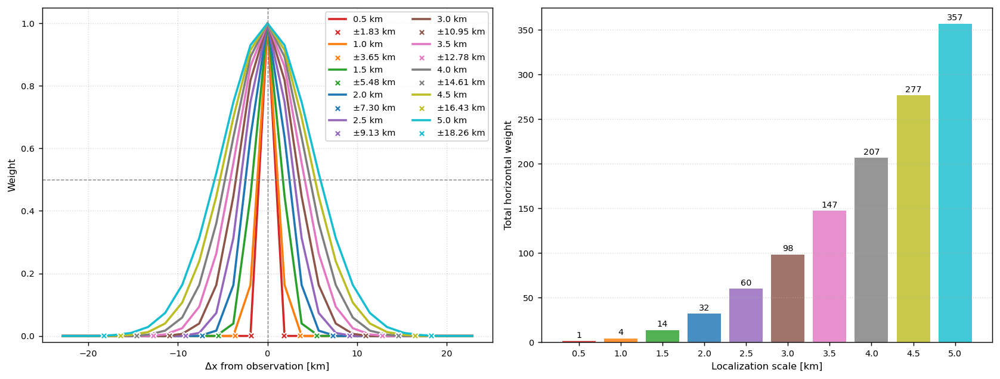

── Marginal gain in total effective weight per +0.5 km step ──
   loc    Σ weight   Δ from prev   % increase
   0.5         1.3             —            —
   1.0         4.2          +2.9       230.8%
   1.5        13.7          +9.5       225.1%
   2.0        31.8         +18.2       133.0%
   2.5        59.9         +28.1        88.2%
   3.0        98.4         +38.4        64.1%
   3.5       147.3         +49.0        49.8%
   4.0       206.8         +59.5        40.4%
   4.5       276.8         +69.9        33.8%
   5.0       356.9         +80.2        29.0%


In [8]:
# ── Figure 6: 1-D weight profiles and total effective weight per scale ────────

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

# ── Left: horizontal weight profile at obs level (dz = 0) ────────────────────
ax = axes[0]
xc_mid = xc_w[:, k_obs]          # x coords at obs level  (n_x,)

for l in LOC_SCALES:
    cutoff_dist = l * R_CUT
    dx_n = (xc_mid - x0c_w) / l
    d2   = dx_n ** 2              # dz = 0
    w    = np.where(d2 <= D2_CUTOFF, np.exp(-0.5 * d2), 0.0)
    ax.plot(xc_mid - x0c_w, w, color=LOC_COLORS[l], linewidth=2,
            label=f'{l} km')
    #plot the cutoff points
    cutoff_x = np.array([-cutoff_dist, cutoff_dist])
    cutoff_w = np.array([np.exp(-0.5 * D2_CUTOFF), np.exp(-0.5 * D2_CUTOFF)])
    ax.scatter(cutoff_x, cutoff_w, color=LOC_COLORS[l], s=40, zorder=5, marker='X',edgecolors='white', label=f'±{cutoff_dist:2.2f} km')
ax.axhline(0.5, color='gray', linewidth=0.8, linestyle='--')
ax.axvline(0, color='gray', linewidth=0.8, linestyle='--')
ax.set_xlabel('Δx from observation [km]', fontsize=9)
ax.set_ylabel('Weight', fontsize=9)
#ax.set_title('Horizontal weight profile  (at obs level, z = z₀)', fontsize=10)
ax.legend(fontsize=8, ncol=2)
ax.set_ylim(-0.02, 1.05)
ax.grid(True, linestyle=':', alpha=0.5)

# ── Right: total effective weight (3-D sum) per scale ────────────────────────
ax = axes[1]
total_w = []
for l in LOC_SCALES:
    dxg3 = pos_km[:, :, :, 0] - float(pos_km[i0, j0, k_obs, 0])
    dyg3 = pos_km[:, :, :, 1] - float(pos_km[i0, j0, k_obs, 1])
    dzg3 = pos_km[:, :, :, 2] - z_lev[k_obs]
    d2_3d = (dxg3 / l) ** 2 + (dyg3 / l) ** 2 + (dzg3 / l) ** 2
    w_3d  = np.where(d2_3d <= D2_CUTOFF, np.exp(-0.5 * d2_3d), 0.0)
    total_w.append(float(w_3d.sum()))

ax.bar(range(len(LOC_SCALES)), total_w,
       color=[LOC_COLORS[l] for l in LOC_SCALES], alpha=0.82)
for i, (tw, l) in enumerate(zip(total_w, LOC_SCALES)):
    ax.text(i, tw + max(total_w) * 0.01, f'{tw:.0f}',
            ha='center', fontsize=8)
ax.set_xticks(range(len(LOC_SCALES)))
ax.set_xticklabels([str(l) for l in LOC_SCALES])
ax.set_xlabel('Localization scale [km]', fontsize=9)
ax.set_ylabel('Total horizontal weight', fontsize=9)
#ax.set_title('Total effective weight per scale (3-D sum)', fontsize=10)
ax.grid(True, linestyle=':', alpha=0.5, axis='y')

plt.tight_layout()
plt.show()

# Marginal gain table
print('── Marginal gain in total effective weight per +0.5 km step ──')
print(f"{'loc':>6}  {'Σ weight':>10}  {'Δ from prev':>12}  {'% increase':>11}")
for i, (l, tw) in enumerate(zip(LOC_SCALES, total_w)):
    if i == 0:
        print(f"{l:>6.1f}  {tw:>10.1f}  {'—':>12}  {'—':>11}")
    else:
        delta  = tw - total_w[i - 1]
        pct    = 100 * delta / total_w[i - 1]
        print(f"{l:>6.1f}  {tw:>10.1f}  {delta:>+12.1f}  {pct:>10.1f}%")


In [9]:
# ============================================================
# CONFIGURATION — edit here
# ============================================================

DATA_ROOT = '/home/jorge.gacitua/datosmunin/WRF_Single_Cycle_Assimilation/data'

EXPERIMENTS = [
    {'loc_scale': 0.5, 'directory': 'WS_sweep_test_1800_LOC0.5', 'file_glob': 'WS_sweep_LOC0.5_sweep_Ne040_tm*.npz'},
    {'loc_scale': 1.0, 'directory': 'WS_sweep_test_1800_LOC1.0', 'file_glob': 'WS_sweep_LOC1.0_sweep_Ne040_tm*.npz'},
    {'loc_scale': 1.5, 'directory': 'WS_sweep_test_1800_LOC1.5', 'file_glob': 'WS_sweep_LOC1.5_sweep_Ne040_tm*.npz'},
    {'loc_scale': 2.0, 'directory': 'WS_sweep_test_1800_LOC2.0', 'file_glob': 'WS_sweep_LOC2.0_sweep_Ne040_tm*.npz'},
    {'loc_scale': 2.5, 'directory': 'WS_sweep_test_1800_LOC2.5', 'file_glob': 'WS_sweep_LOC2.5_sweep_Ne040_tm*.npz'},
    {'loc_scale': 3.0, 'directory': 'WS_sweep_test_1800_LOC3.0', 'file_glob': 'WS_sweep_LOC3.0_sweep_Ne040_tm*.npz'},
    {'loc_scale': 3.5, 'directory': 'WS_sweep_test_1800_LOC3.5', 'file_glob': 'WS_sweep_LOC3.5_sweep_Ne040_tm*.npz'},
    {'loc_scale': 4.0, 'directory': 'WS_sweep_test_1800_LOC4.0', 'file_glob': 'WS_sweep_LOC4.0_sweep_Ne040_tm*.npz'},
    {'loc_scale': 4.5, 'directory': 'WS_sweep_test_1800_LOC4.5', 'file_glob': 'WS_sweep_LOC4.5_sweep_Ne040_tm*.npz'},
    {'loc_scale': 5.0, 'directory': 'WS_sweep_test_1800_LOC5.0', 'file_glob': 'WS_sweep_LOC5.0_sweep_Ne040_tm*.npz'},
]

FILTER_METHOD = 'TEnKF'
FILTER_NTEMP  = [1, 2, 3, 5]

# Set True to load a random sample per loc_scale (faster iteration)
SUBSAMPLE   = False
SUBSAMPLE_N = 500_000

print('Configuration set.')

Configuration set.


In [10]:
# ============================================================
# DATA LOADING
# ============================================================

all_dfs = []

for exp in EXPERIMENTS:
    loc  = exp['loc_scale']
    dirp = os.path.join(DATA_ROOT, exp['directory'])
    files = sorted(glob.glob(os.path.join(dirp, exp['file_glob'])))
    print(f'loc={loc}: found {len(files)} files in {exp["directory"]}')

    loc_dfs = []
    for fpath in files:
        try:
            raw = load_sweep_npz(fpath)
            raw = raw[(raw['method'] == FILTER_METHOD) &
                      (raw['ntemp'].isin(FILTER_NTEMP))]
            raw['loc_scale'] = loc
            loc_dfs.append(raw)
        except Exception as e:
            print(f'  SKIP {os.path.basename(fpath)}: {e}')

    loc_df = pd.concat(loc_dfs, ignore_index=True)

    if SUBSAMPLE:
        loc_df = loc_df.sample(n=min(SUBSAMPLE_N, len(loc_df)),
                               random_state=42).reset_index(drop=True)

    print(f'  -> {len(loc_df):,} rows after filter')
    all_dfs.append(loc_df)

df = pd.concat(all_dfs, ignore_index=True)
df = add_derived_cols(df)

print(f'\nTotal rows: {len(df):,}')
print(f'loc_scale : {sorted(df.loc_scale.unique())}')
print(f'ntemp     : {sorted(df.ntemp.unique())}')
print(f'methods   : {df.method.unique()}')
print(f'columns   : {len(df.columns)}')

loc=0.5: found 60 files in WS_sweep_test_1800_LOC0.5


  -> 1,624,864 rows after filter
loc=1.0: found 60 files in WS_sweep_test_1800_LOC1.0
  -> 1,624,864 rows after filter
loc=1.5: found 60 files in WS_sweep_test_1800_LOC1.5
  -> 1,624,864 rows after filter
loc=2.0: found 60 files in WS_sweep_test_1800_LOC2.0
  -> 1,624,864 rows after filter
loc=2.5: found 60 files in WS_sweep_test_1800_LOC2.5
  -> 1,624,864 rows after filter
loc=3.0: found 60 files in WS_sweep_test_1800_LOC3.0
  -> 1,624,864 rows after filter
loc=3.5: found 60 files in WS_sweep_test_1800_LOC3.5
  -> 1,624,864 rows after filter
loc=4.0: found 60 files in WS_sweep_test_1800_LOC4.0
  -> 1,624,864 rows after filter
loc=4.5: found 60 files in WS_sweep_test_1800_LOC4.5
  -> 1,624,864 rows after filter
loc=5.0: found 60 files in WS_sweep_test_1800_LOC5.0
  -> 1,624,864 rows after filter

Total rows: 16,248,640
loc_scale : [np.float64(0.5), np.float64(1.0), np.float64(1.5), np.float64(2.0), np.float64(2.5), np.float64(3.0), np.float64(3.5), np.float64(4.0), np.float64(4.5), np.

In [11]:
df = add_derived_cols(df)

## 1. Prior and Analysis Departure Distributions

Prior O−B should be identical across localization scales (same truth members, same obs).
Analysis O−A shows how well each scale corrects the departures.

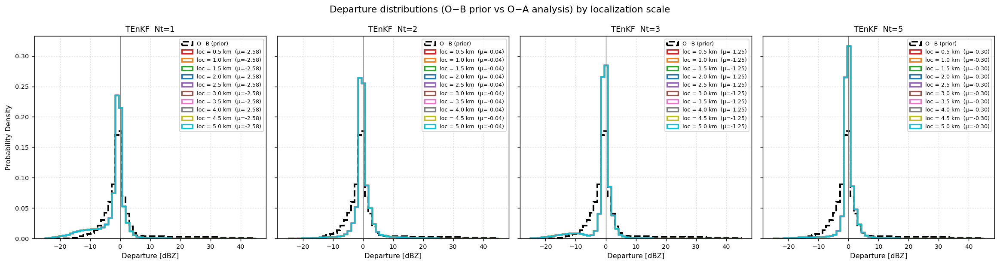

In [12]:
hist_bins  = 60
hist_range = (-25, 45)

fig, axes = plt.subplots(1, len(FILTER_NTEMP),
                          figsize=(4.5 * len(FILTER_NTEMP), 4.8),
                          sharey=True, sharex=True)
fig.suptitle('Departure distributions (O−B prior vs O−A analysis) by localization scale', fontsize=12)

for ax, nt in zip(axes, FILTER_NTEMP):
    sub = df[df['ntemp'] == nt]

    # Prior O-B: same for all scales — show once using loc=2.0
    ob_vals = sub[sub['loc_scale'] == 2.0]['dep_b'].values
    ob_vals = ob_vals[np.isfinite(ob_vals) & (ob_vals != 0)]
    ax.hist(ob_vals, bins=hist_bins, range=hist_range,
            density=True, histtype='step', linewidth=2.2,
            color='black', linestyle='--', label='O−B (prior)')

    for loc in LOC_SCALES:
        oa_vals = sub[sub['loc_scale'] == loc]['dep_a'].values
        oa_vals = oa_vals[np.isfinite(oa_vals) & (oa_vals != 0)]
        mu = np.nanmean(oa_vals)
        ax.hist(oa_vals, bins=hist_bins, range=hist_range,
                density=True, histtype='step', linewidth=1.8,
                color=LOC_COLORS[loc],
                label=f'{LOC_LABELS[loc]}  (μ={mu:.2f})')

    ax.axvline(0, color='gray', linewidth=0.8)
    ax.set_title(f'TEnKF  Nt={nt}')
    ax.set_xlabel('Departure [dBZ]')
    ax.legend(fontsize=7)
    ax.grid(True, linestyle=':', alpha=0.5)

axes[0].set_ylabel('Probability Density')
plt.tight_layout()
plt.show()

### TEST the acumulated MSE and bias instead of departures in the cutoff zone

## 2. Binned dRMSE_w vs Prior Departure (O−B)

How does RMSE reduction vary with the magnitude of the prior departure?

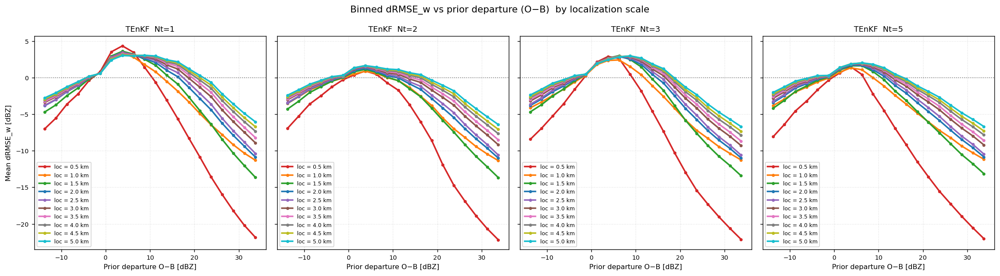

In [13]:
dep_b_edges = np.linspace(-15, 35, 21)

fig, axes = plt.subplots(1, len(FILTER_NTEMP),
                          figsize=(4.5 * len(FILTER_NTEMP), 5),
                          sharey=True, sharex=True)
fig.suptitle('Binned dRMSE_w vs prior departure (O−B)  by localization scale', fontsize=12)

for ax, nt in zip(axes, FILTER_NTEMP):
    sub_nt = df[df['ntemp'] == nt]

    for loc in LOC_SCALES:
        sub = sub_nt[sub_nt['loc_scale'] == loc]
        centers, means, stds = binned_stats(
            sub['dep_b'].values, sub['drmse_w'].values, dep_b_edges)
        valid = ~np.isnan(means)
        ax.plot(centers[valid], means[valid],
                color=LOC_COLORS[loc], linewidth=2, marker='o', markersize=3,
                label=LOC_LABELS[loc])
        #ax.fill_between(centers[valid],
        #                means[valid] - stds[valid], means[valid] + stds[valid],
        #                color=LOC_COLORS[loc], alpha=0.10)

    ax.axhline(0, color='gray', linewidth=1, linestyle=':')
    ax.set_title(f'TEnKF  Nt={nt}')
    ax.set_xlabel('Prior departure O−B [dBZ]')
    ax.legend(fontsize=7)
    ax.grid(True, linestyle=':', alpha=0.4)

axes[0].set_ylabel('Mean dRMSE_w [dBZ]')
plt.tight_layout()
plt.show()

## 3. Binned dRMSE_w vs Storm Intensity

Does localization scale performance depend on local storm intensity?

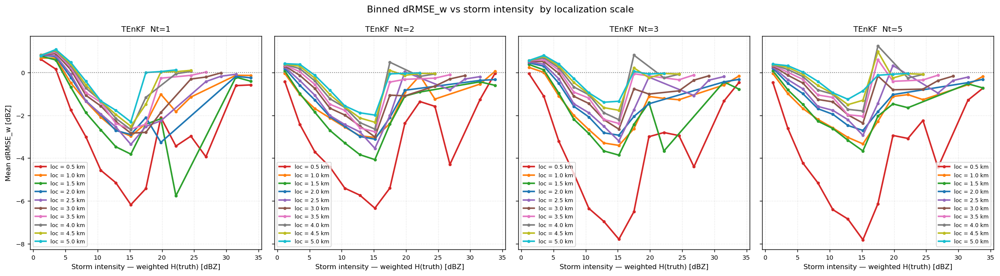

In [14]:
int_edges = np.linspace(0, 35, 16)

fig, axes = plt.subplots(1, len(FILTER_NTEMP),
                          figsize=(4.5 * len(FILTER_NTEMP), 5),
                          sharey=True, sharex=True)
fig.suptitle('Binned dRMSE_w vs storm intensity  by localization scale', fontsize=12)

for ax, nt in zip(axes, FILTER_NTEMP):
    sub_nt = df[df['ntemp'] == nt]

    for loc in LOC_SCALES:
        sub = sub_nt[sub_nt['loc_scale'] == loc]
        centers, means, stds = binned_stats(
            sub['hx_dbz_local_mean_w'].values, sub['drmse_w'].values, int_edges)
        valid = ~np.isnan(means)
        ax.plot(centers[valid], means[valid],
                color=LOC_COLORS[loc], linewidth=2, marker='o', markersize=3,
                label=LOC_LABELS[loc])
        #ax.fill_between(centers[valid],
        #                means[valid] - stds[valid], means[valid] + stds[valid],
        #                color=LOC_COLORS[loc], alpha=0.10)

    ax.axhline(0, color='gray', linewidth=1, linestyle=':')
    ax.set_title(f'TEnKF  Nt={nt}')
    ax.set_xlabel('Storm intensity — weighted H(truth) [dBZ]')
    ax.legend(fontsize=7)
    ax.grid(True, linestyle=':', alpha=0.4)

axes[0].set_ylabel('Mean dRMSE_w [dBZ]')
plt.tight_layout()
plt.show()

## 4. 2D Phase Space: Prior Departure × Storm Intensity → dRMSE_w

Rows = localization scale, columns = ntemp.  
Blue = improvement, red = degradation.

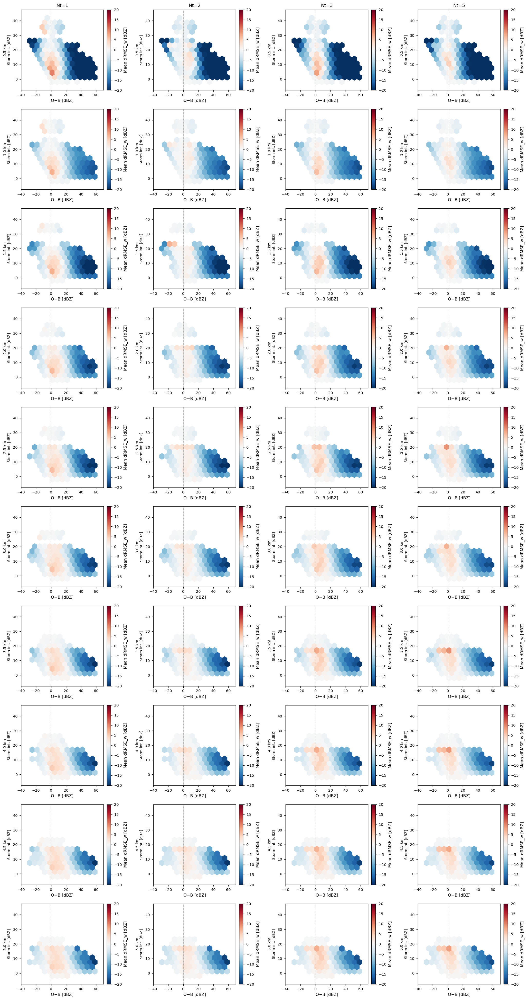

In [15]:
gridsize   = 15
x_extent   = [-35, 65]
y_extent   = [-5, 45]
vmin, vmax = -20, 20

fig, axes = plt.subplots(len(LOC_SCALES), len(FILTER_NTEMP),
                          figsize=(4 * len(FILTER_NTEMP),
                                   3 * len(LOC_SCALES)),
                          sharex=False, sharey=False)
#fig.suptitle('Prior departure × storm intensity → mean dRMSE_w\n'
#             '(blue = improvement, red = degradation)', fontsize=12)

hb_ref = None
for ri, loc in enumerate(LOC_SCALES):
    for ci, nt in enumerate(FILTER_NTEMP):
        ax  = axes[ri][ci]
        sub = df[(df['loc_scale'] == loc) & (df['ntemp'] == nt)]
        x   = sub['dep_b'].values
        y   = sub['hx_dbz_local_mean_w'].values
        c   = sub['drmse_w'].values
        mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(c)

        hb = ax.hexbin(x[mask], y[mask], C=c[mask],
                        gridsize=gridsize,
                        extent=x_extent + y_extent,
                        reduce_C_function=np.mean,
                        cmap='RdBu_r', vmin=vmin, vmax=vmax, mincnt=3)
        hb_ref = hb
        ax.axvline(0, color='gray', linewidth=0.6, linestyle='--', alpha=0.6)

        if ri == 0:
            ax.set_title(f'Nt={nt}', fontsize=10)
        #if ci == 0:
        ax.set_ylabel(f'{loc} km\nStorm int. [dBZ]', fontsize=8)
        #if ri == len(LOC_SCALES) - 1:
        ax.set_xlabel('O−B [dBZ]')
        plt.colorbar(hb, ax=ax, orientation='vertical', fraction=0.2, pad=0.03, label='Mean dRMSE_w [dBZ]')   

#if hb_ref is not None:
#    fig.colorbar(hb_ref, ax=axes, orientation='vertical',
#                 fraction=0.015, pad=0.03, label='Mean dRMSE_w [dBZ]')
#plt.tight_layout(rect=[0, 0, 0.93, 1])
plt.tight_layout()
plt.show()

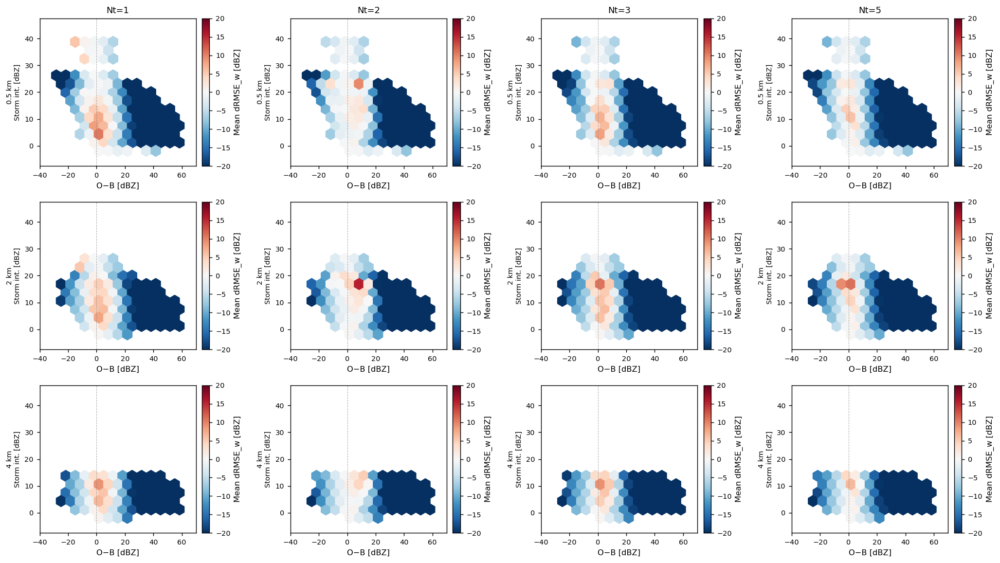

In [16]:
gridsize   = 15
x_extent   = [-35, 65]
y_extent   = [-5, 45]
vmin, vmax = -20, 20
LOC_SCALES_subset = [0.5,2,4]
fig, axes = plt.subplots(len(LOC_SCALES_subset), len(FILTER_NTEMP),
                          figsize=(4 * len(FILTER_NTEMP),
                                   3 * len(LOC_SCALES_subset)),
                          sharex=False, sharey=False)
#fig.suptitle('Prior departure × storm intensity → mean dRMSE_w\n'
#             '(blue = improvement, red = degradation)', fontsize=12)

hb_ref = None
for ri, loc in enumerate(LOC_SCALES_subset):
    for ci, nt in enumerate(FILTER_NTEMP):
        ax  = axes[ri][ci]
        sub = df[(df['loc_scale'] == loc) & (df['ntemp'] == nt)]
        x   = sub['dep_b'].values
        y   = sub['hx_dbz_local_mean_u'].values
        c   = sub['drmse_point'].values
        mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(c)

        hb = ax.hexbin(x[mask], y[mask], C=c[mask],
                        gridsize=gridsize,
                        extent=x_extent + y_extent,
                        reduce_C_function=np.mean,
                        cmap='RdBu_r', vmin=vmin, vmax=vmax, mincnt=3)
        hb_ref = hb
        ax.axvline(0, color='gray', linewidth=0.6, linestyle='--', alpha=0.6)

        if ri == 0:
            ax.set_title(f'Nt={nt}', fontsize=10)
        #if ci == 0:
        ax.set_ylabel(f'{loc} km\nStorm int. [dBZ]', fontsize=8)
        #if ri == len(LOC_SCALES) - 1:
        ax.set_xlabel('O−B [dBZ]')
        plt.colorbar(hb, ax=ax, orientation='vertical', fraction=0.2, pad=0.03, label='Mean dRMSE_w [dBZ]')   

#if hb_ref is not None:
#    fig.colorbar(hb_ref, ax=axes, orientation='vertical',
#                 fraction=0.015, pad=0.03, label='Mean dRMSE_w [dBZ]')
#plt.tight_layout(rect=[0, 0, 0.93, 1])
plt.tight_layout()
plt.show()

## 4b. Phase-Space Diagnostic: Understanding DA-Degrading Points

The 2D phase space above shows a zone where DA consistently degrades (positive mean dRMSE_w):
**small prior innovation** (dep_b ≈ −10 to +20 dBZ) × **low storm intensity** (H(truth) < 20 dBZ).

The likely physical explanation: the observation says "low reflectivity" (or no storm), the prior also says "low reflectivity", so the departure is small and the update is small — but the assimilation still perturbs the ensemble slightly, which in some configurations increases RMSE rather than reducing it.

Below we investigate:
1. **Where** in the domain these bad points are located
2. **What the observations and prior look like** (from sweep data statistics already loaded)
3. **Optionally**: full prior ensemble distribution loaded from the source npz

In [17]:
# ── Configuration ─────────────────────────────────────────────────────────────
NT_FOCUS         = 1            # ntemp to analyze (change freely to explore others)
INNOV_BAD_LO     = -10          # dep_b lower bound for bad zone [dBZ]
INNOV_BAD_HI     =  20          # dep_b upper bound for bad zone [dBZ]
REFL_BAD_MAX     =  20          # max storm intensity in bad zone [dBZ]
LOC_FOCUS        = [1.0, 4.0]  # two loc scales for neighborhood comparison

PRIOR_FILE_ENS = (
    '/home/jorge.gacitua/datosmunin/WRF_Single_Cycle_Assimilation/data/'
    '3D_subsets_20240319_GUES_20240319180000/subset_20240319180000.npz'
)
PRIOR_VAR_NAMES = ['qg', 'qr', 'qs', 'T', 'P', 'u', 'v', 'w']

# ── Phase-space bad zone mask ─────────────────────────────────────────────────
in_bad_zone = (
    (df['ntemp'] == NT_FOCUS) &
    (df['dep_b'] >= INNOV_BAD_LO) &
    (df['dep_b'] <= INNOV_BAD_HI) &
    (df['hx_dbz_local_mean_w'] < REFL_BAD_MAX)
)

# Aggregate over truth members: mean drmse_w per (i, j, k, loc_scale)
bad_agg = (
    df[in_bad_zone]
    .groupby(['i', 'j', 'k', 'loc_scale'])
    .agg(
        mean_drmse_w  = ('drmse_w',               'mean'),
        count         = ('drmse_w',               'count'),
        mean_dep_b    = ('dep_b',                 'mean'),
        mean_intensity= ('hx_dbz_local_mean_w',   'mean'),
        mean_yo       = ('yo_clean',              'mean'),
        mean_hxf      = ('hxf_mean_obs',          'mean'),
        mean_spread_f = ('spread_f_obs',          'mean'),
        mean_spread_a = ('spread_a_obs',          'mean'),
    )
    .reset_index()
)

# "Bad" = mean drmse across truth members is positive
consistently_bad = bad_agg[bad_agg['mean_drmse_w'] > 0].copy()
consistently_good = bad_agg[bad_agg['mean_drmse_w'] <= 0].copy()

print(f"Phase-space bad zone filter  (ntemp={NT_FOCUS}, "
      f"dep_b∈[{INNOV_BAD_LO},{INNOV_BAD_HI}], intensity<{REFL_BAD_MAX} dBZ)")
print(f"  Total locations in zone: {len(bad_agg):,}")
print(f"  Consistently BAD  (mean drmse_w > 0): {len(consistently_bad):,}")
print(f"  Consistently GOOD (mean drmse_w ≤ 0): {len(consistently_good):,}")
print(f"\n  Bad locations per loc_scale:")
print(consistently_bad.groupby('loc_scale')['count'].agg(['count','sum']).rename(
    columns={'count': 'n_locs', 'sum': 'total_rows'}))

Phase-space bad zone filter  (ntemp=1, dep_b∈[-10,20], intensity<20 dBZ)
  Total locations in zone: 67,881
  Consistently BAD  (mean drmse_w > 0): 53,081
  Consistently GOOD (mean drmse_w ≤ 0): 14,800

  Bad locations per loc_scale:
           n_locs  total_rows
loc_scale                    
0.5          3800      207640
1.0          4550      249558
1.5          4901      270356
2.0          5285      291546
2.5          5485      302789
3.0          5641      311595
3.5          5743      317354
4.0          5823      321808
4.5          5889      325451
5.0          5964      329680


NameError: name '_i_coords' is not defined

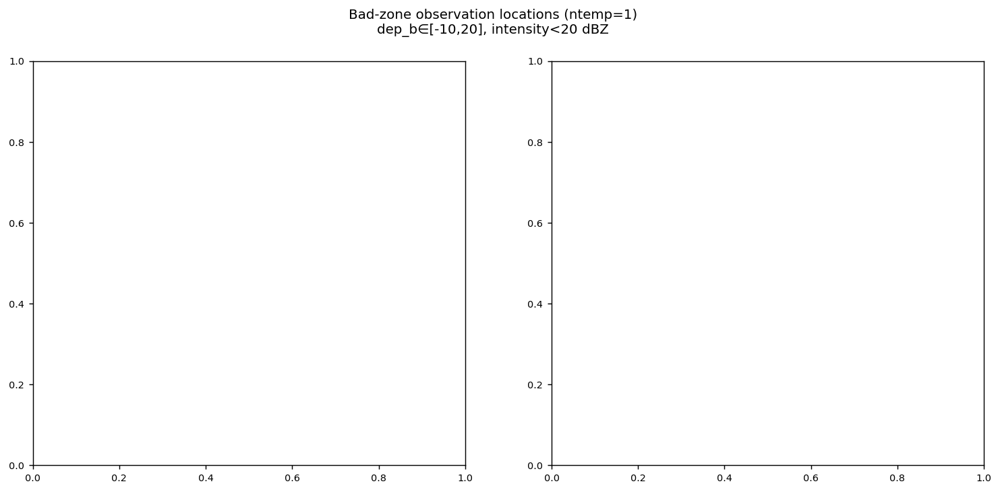

In [18]:
# ── Figure 1: Spatial map of bad vs. good DA locations ───────────────────────
# One panel per loc_scale in LOC_FOCUS
# Background: observed reflectivity contours; markers colored by mean drmse_w

fig, axes = plt.subplots(1, len(LOC_FOCUS),
                          figsize=(7 * len(LOC_FOCUS), 6), squeeze=False)
fig.suptitle(f'Bad-zone observation locations (ntemp={NT_FOCUS})\n'
             f'dep_b∈[{INNOV_BAD_LO},{INNOV_BAD_HI}], intensity<{REFL_BAD_MAX} dBZ',
             fontsize=11)

for ax, loc in zip(axes[0], LOC_FOCUS):
    sub_bad  = consistently_bad[consistently_bad['loc_scale'] == loc]
    sub_good = consistently_good[consistently_good['loc_scale'] == loc]

    # Reflectivity background
    ax.pcolormesh(_i_coords, _j_coords, _max_yo_2d.T,
                  cmap='Greys_r', vmin=-20, vmax=60, shading='auto', alpha=0.4)
    ax.contour(_i_coords, _j_coords, _max_yo_2d.T,
               levels=[20, 50], colors='gray', linewidths=0.8, linestyles='--')

    # Good locations
    if len(sub_good):
        ax.scatter(sub_good['i'], sub_good['j'],
                   c='steelblue', s=8, alpha=0.4, zorder=3, label=f'GOOD ({len(sub_good)})')
    # Bad locations colored by drmse magnitude
    if len(sub_bad):
        sc = ax.scatter(sub_bad['i'], sub_bad['j'],
                        c=sub_bad['mean_drmse_w'],
                        cmap='Reds', vmin=0, vmax=sub_bad['mean_drmse_w'].quantile(0.95),
                        s=15, zorder=5, label=f'BAD ({len(sub_bad)})')
        plt.colorbar(sc, ax=ax, label='Mean dRMSE_w [dBZ]')

    ax.set_title(f'loc = {loc} km')
    ax.set_xlabel('x (grid index i)')
    ax.set_ylabel('y (grid index j)')
    ax.legend(fontsize=8, markerscale=2)

plt.tight_layout()
plt.show()

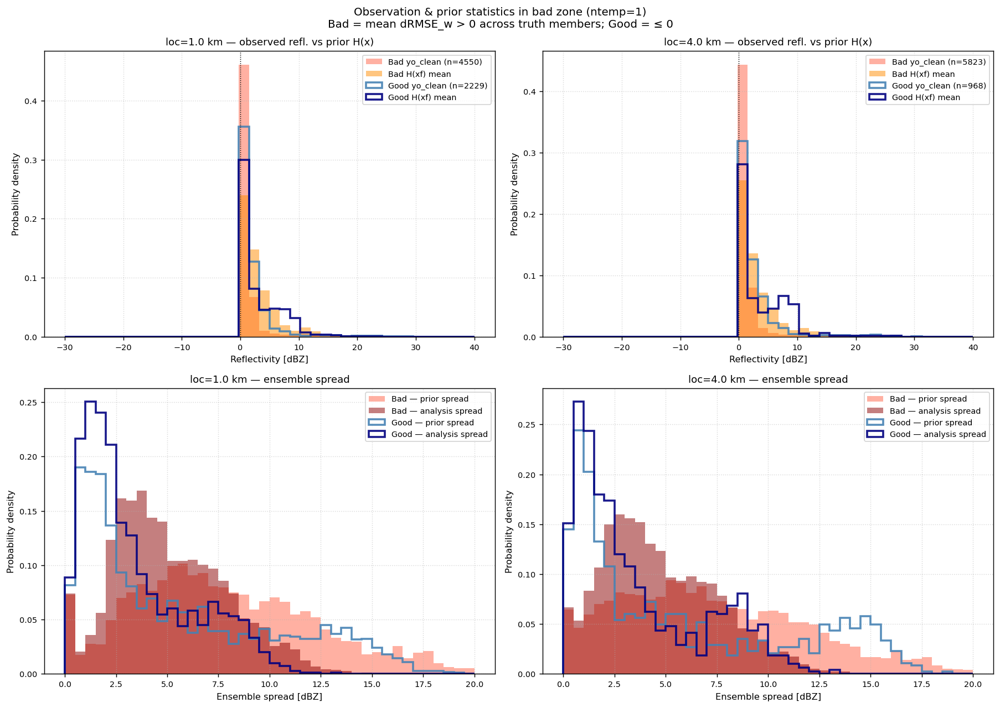

In [ ]:
# ── Figure 2: Observation and prior statistics at bad vs. good locations ──────
# Compares distributions of yo_clean, hxf_mean_obs, spread_f_obs between
# consistently bad and consistently good DA locations in the bad zone.

fig, axes = plt.subplots(2, len(LOC_FOCUS), figsize=(7 * len(LOC_FOCUS), 10))
fig.suptitle(f'Observation & prior statistics in bad zone (ntemp={NT_FOCUS})\n'
             'Bad = mean dRMSE_w > 0 across truth members; Good = ≤ 0', fontsize=11)

hist_kw_bad  = dict(density=True, histtype='stepfilled', alpha=0.5, color='tomato',   bins=40)
hist_kw_good = dict(density=True, histtype='step',       alpha=0.9, color='steelblue', bins=40, linewidth=2)

for ci, loc in enumerate(LOC_FOCUS):
    sub_bad  = consistently_bad[consistently_bad['loc_scale'] == loc]
    sub_good = consistently_good[consistently_good['loc_scale'] == loc]

    # Row 0: yo_clean (observed reflectivity) and hxf_mean_obs (prior H(x) mean)
    ax = axes[0, ci]
    if len(sub_bad):
        ax.hist(sub_bad['mean_yo'],  label=f'Bad yo_clean (n={len(sub_bad)})',
                **{**hist_kw_bad,  'range': (-30, 40)})
        ax.hist(sub_bad['mean_hxf'], label='Bad H(xf) mean',
                **{**hist_kw_bad, 'color': 'darkorange', 'range': (-30, 40)})
    if len(sub_good):
        ax.hist(sub_good['mean_yo'],  label=f'Good yo_clean (n={len(sub_good)})',
                **{**hist_kw_good, 'range': (-30, 40)})
        ax.hist(sub_good['mean_hxf'], label='Good H(xf) mean',
                **{**hist_kw_good, 'color': 'navy', 'range': (-30, 40)})
    ax.axvline(0, color='k', linewidth=0.8, linestyle=':')
    ax.set_title(f'loc={loc} km — observed refl. vs prior H(x)')
    ax.set_xlabel('Reflectivity [dBZ]')
    ax.set_ylabel('Probability density')
    ax.legend(fontsize=8)
    ax.grid(True, linestyle=':', alpha=0.5)

    # Row 1: prior and analysis ensemble spread
    ax = axes[1, ci]
    rng = (0, 20)
    if len(sub_bad):
        ax.hist(sub_bad['mean_spread_f'],  label='Bad — prior spread',
                **{**hist_kw_bad, 'range': rng})
        ax.hist(sub_bad['mean_spread_a'],  label='Bad — analysis spread',
                **{**hist_kw_bad, 'color': 'darkred', 'range': rng})
    if len(sub_good):
        ax.hist(sub_good['mean_spread_f'], label='Good — prior spread',
                **{**hist_kw_good, 'range': rng})
        ax.hist(sub_good['mean_spread_a'], label='Good — analysis spread',
                **{**hist_kw_good, 'color': 'navy', 'range': rng})
    ax.set_title(f'loc={loc} km — ensemble spread')
    ax.set_xlabel('Ensemble spread [dBZ]')
    ax.set_ylabel('Probability density')
    ax.legend(fontsize=8)
    ax.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

Top-5 worst bad points (loc=1.0 km, ntemp=1):
  i   j  k  mean_drmse_w  mean_dep_b  mean_intensity  mean_yo  mean_hxf
220 660  8          9.57       -0.34            1.44     0.00      1.35
420 500  5          9.41       -0.15            1.16     0.03      1.31
180 880  9          9.24       -0.34            1.33     0.00      1.37
220 660  7          8.90       -0.22            1.90     0.00      1.39
180 460  8          8.71       -0.48            1.37     0.00      1.41


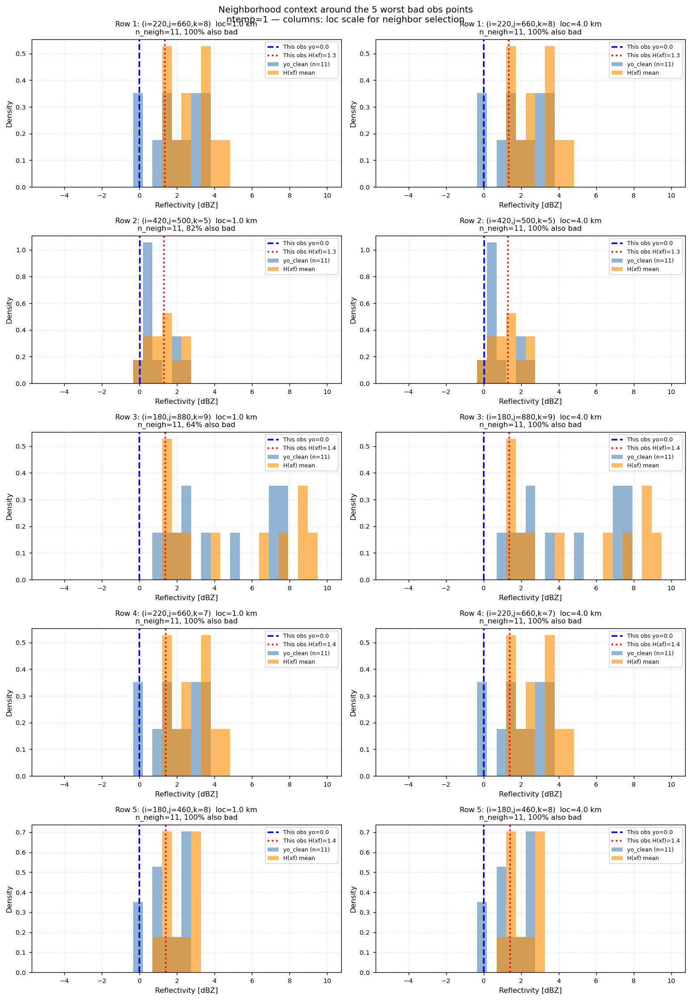

In [ ]:
# ── Figure 3: Neighborhood comparison — what loc=1 vs loc=4 "see" ────────────
# Pick the N_FOCUS worst bad points (highest mean drmse_w), then for each,
# show the distribution of yo_clean, hxf_mean_obs, and drmse_w for all
# OTHER sweep observations that fall within that localization radius.

N_FOCUS   = 5        # number of worst bad points to analyze
STRIDE_KM = 20 * float(pos_km[1, 0, 0, 0] - pos_km[0, 0, 0, 0])  # stride in km

# Use a single reference loc_scale for picking bad points (first LOC_FOCUS)
ref_loc = LOC_FOCUS[0]
top_bad = (consistently_bad[consistently_bad['loc_scale'] == ref_loc]
           .nlargest(N_FOCUS, 'mean_drmse_w')
           .reset_index(drop=True))

print(f"Top-{N_FOCUS} worst bad points (loc={ref_loc} km, ntemp={NT_FOCUS}):")
print(top_bad[['i', 'j', 'k', 'mean_drmse_w', 'mean_dep_b',
               'mean_intensity', 'mean_yo', 'mean_hxf']].to_string(index=False, float_format='{:.2f}'.format))

# For the neighborhood, use df filtered to NT_FOCUS (aggregated over truth members)
df_nt = df[df['ntemp'] == NT_FOCUS].copy()
df_nt_agg = (
    df_nt.groupby(['i', 'j', 'k', 'loc_scale'])
    .agg(
        mean_drmse_w  = ('drmse_w',              'mean'),
        mean_yo       = ('yo_clean',             'mean'),
        mean_hxf      = ('hxf_mean_obs',         'mean'),
        mean_spread_f = ('spread_f_obs',         'mean'),
    )
    .reset_index()
)

# Get km coordinates for all sweep points
all_ij = df_nt_agg[['i', 'j', 'k']].values.astype(int)
all_xkm = pos_km[all_ij[:, 0], all_ij[:, 1], all_ij[:, 2], 0]
all_ykm = pos_km[all_ij[:, 0], all_ij[:, 1], all_ij[:, 2], 1]

fig, axes = plt.subplots(N_FOCUS, len(LOC_FOCUS),
                          figsize=(6 * len(LOC_FOCUS), 3.5 * N_FOCUS))
if N_FOCUS == 1:
    axes = axes[np.newaxis, :]
fig.suptitle(f'Neighborhood context around the {N_FOCUS} worst bad obs points\n'
             f'ntemp={NT_FOCUS} — columns: loc scale for neighbor selection',
             fontsize=11)

for ri, row in top_bad.iterrows():
    pi, pj, pk = int(row['i']), int(row['j']), int(row['k'])
    p_xkm = float(pos_km[pi, pj, pk, 0])
    p_ykm = float(pos_km[pi, pj, pk, 1])

    for ci, loc in enumerate(LOC_FOCUS):
        ax = axes[ri][ci]

        # Find neighbors within GC cutoff: dist_horizontal ≤ loc * R_CUT km
        dist_h = np.sqrt((all_xkm - p_xkm)**2 + (all_ykm - p_ykm)**2)
        cutoff_km = loc * R_CUT
        in_radius = dist_h <= cutoff_km

        sub_loc  = df_nt_agg[df_nt_agg['loc_scale'] == loc]
        all_ij_loc = sub_loc[['i', 'j', 'k']].values.astype(int)
        all_xkm_loc = pos_km[all_ij_loc[:, 0], all_ij_loc[:, 1], all_ij_loc[:, 2], 0]
        all_ykm_loc = pos_km[all_ij_loc[:, 0], all_ij_loc[:, 1], all_ij_loc[:, 2], 1]
        dist_loc = np.sqrt((all_xkm_loc - p_xkm)**2 + (all_ykm_loc - p_ykm)**2)
        neigh_mask = dist_loc <= cutoff_km
        neighbors = sub_loc[neigh_mask]

        if len(neighbors) == 0:
            ax.text(0.5, 0.5, f'No neighbors\nwithin {cutoff_km:.1f} km',
                    ha='center', va='center', transform=ax.transAxes, fontsize=10)
        else:
            # Histogram of neighbor yo_clean and hxf_mean_obs
            bins = np.linspace(-5, 10, 30)
            ax.hist(neighbors['mean_yo'].values,  bins=bins, density=True, alpha=0.6,
                    label=f'yo_clean (n={len(neighbors)})', color='steelblue')
            ax.hist(neighbors['mean_hxf'].values, bins=bins, density=True, alpha=0.6,
                    label='H(xf) mean', color='darkorange')

            # Mark the observation point itself
            ax.axvline(row['mean_yo'],  color='blue',   linewidth=2, linestyle='--',
                       label=f'This obs yo={row["mean_yo"]:.1f}')
            ax.axvline(row['mean_hxf'], color='red',    linewidth=2, linestyle=':',
                       label=f'This obs H(xf)={row["mean_hxf"]:.1f}')

            # Fraction of neighbors that are bad
            frac_bad = (neighbors['mean_drmse_w'] > 0).mean()
            ax.set_title(f'Row {ri+1}: (i={pi},j={pj},k={pk})  loc={loc} km\n'
                         f'n_neigh={len(neighbors)}, {frac_bad*100:.0f}% also bad',
                         fontsize=9)

        ax.set_xlabel('Reflectivity [dBZ]')
        ax.set_ylabel('Density')
        ax.legend(fontsize=7)
        ax.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

### 4b-Optional: Prior Ensemble Distributions at Bad Locations

The cells below load `state_ensemble` from the raw prior npz file to show the full
60-member prior distribution at the bad observation locations.

**RAM warning**: `state_ensemble` has shape (558, 898, 11, 60, 8) — approximately 10 GB
when decompressed. Ensure your system has sufficient memory before running.
If RAM is limited, only the cells loading from the sweep data (above) are needed.

In [ ]:
# ── Load prior ensemble at bad locations (optional — see RAM warning above) ───
# Use mmap_mode='r' for uncompressed .npz (no RAM overhead for unused arrays).
# For savez_compressed files, numpy decompresses the whole array on first access.

LOAD_PRIOR = True   # set False to skip this and the next cell

if LOAD_PRIOR:
    # Use bad locations from loc=LOC_FOCUS[0] for a representative sample
    ref_loc_prior = LOC_FOCUS[0]
    bad_for_prior = (consistently_bad[consistently_bad['loc_scale'] == ref_loc_prior]
                     .nlargest(200, 'mean_drmse_w'))  # limit to top-200 for speed

    bad_i_p = bad_for_prior['i'].values.astype(int)
    bad_j_p = bad_for_prior['j'].values.astype(int)
    bad_k_p = bad_for_prior['k'].values.astype(int)

    print(f"Loading prior ensemble at {len(bad_i_p)} bad locations...")
    prior_data = np.load(PRIOR_FILE_ENS, mmap_mode='r')
    ens_full   = prior_data['state_ensemble']   # (558, 898, 11, 60, 8)

    # Extract: shape → (n_bad, 60, 8)
    ens_at_bad = np.array(ens_full[bad_i_p, bad_j_p, bad_k_p, :, :])
    del ens_full    # release reference to allow GC / mmap unmap

    print(f"Extracted ensemble shape: {ens_at_bad.shape}")
    print(f"Variable order: {PRIOR_VAR_NAMES}")

    # Also extract a "control" sample from non-bad (good) locations
    good_for_prior = (consistently_good[consistently_good['loc_scale'] == ref_loc_prior]
                      .sample(n=min(200, len(consistently_good[
                          consistently_good['loc_scale'] == ref_loc_prior])),
                          random_state=42))
    good_i_p = good_for_prior['i'].values.astype(int)
    good_j_p = good_for_prior['j'].values.astype(int)
    good_k_p = good_for_prior['k'].values.astype(int)

    prior_data2 = np.load(PRIOR_FILE_ENS, mmap_mode='r')
    ens_full2   = prior_data2['state_ensemble']
    ens_at_good = np.array(ens_full2[good_i_p, good_j_p, good_k_p, :, :])
    del ens_full2
    print(f"Also extracted ensemble at {len(good_i_p)} good locations for comparison.")
else:
    print("LOAD_PRIOR=False — skipping prior ensemble extraction.")

Loading prior ensemble at 200 bad locations...
Extracted ensemble shape: (200, 60, 8)
Variable order: ['qg', 'qr', 'qs', 'T', 'P', 'u', 'v', 'w']
Also extracted ensemble at 200 good locations for comparison.


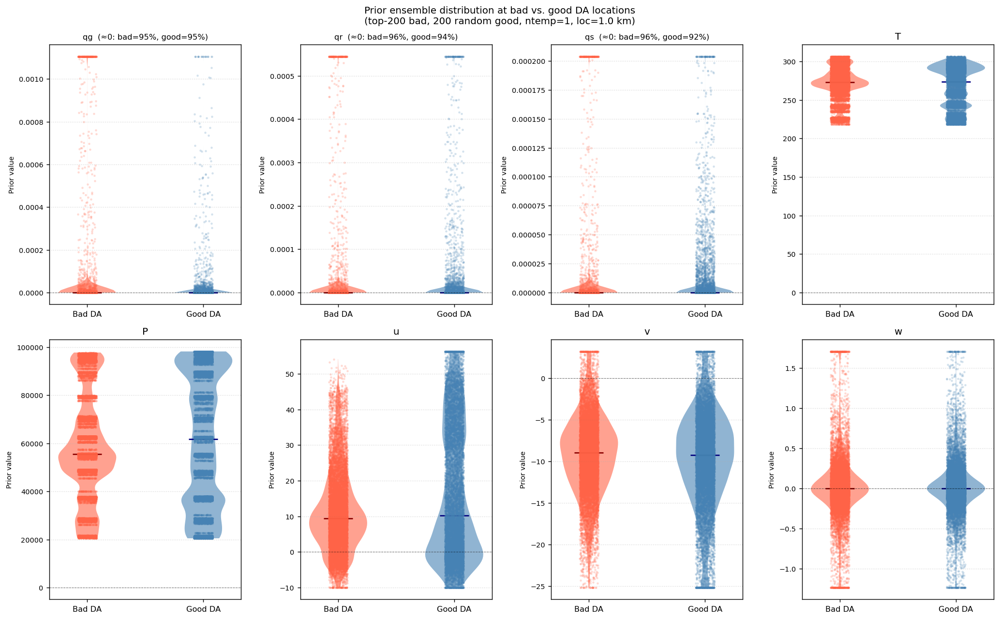

In [ ]:
# ── Figure 4: Violin plots — prior ensemble per variable at bad vs. good locs ─
if LOAD_PRIOR:
    # ens_at_bad shape: (n_bad, 60, 8)  — n_bad locations, 60 members, 8 variables
    # Reshape to (n_bad*60, 8) for easier plotting
    ens_bad_flat  = ens_at_bad.reshape(-1, len(PRIOR_VAR_NAMES))   # all members, all locs
    ens_good_flat = ens_at_good.reshape(-1, len(PRIOR_VAR_NAMES))

    fig, axes = plt.subplots(2, 4, figsize=(16, 10))
    fig.suptitle(f'Prior ensemble distribution at bad vs. good DA locations\n'
                 f'(top-200 bad, 200 random good, ntemp={NT_FOCUS}, loc={ref_loc_prior} km)',
                 fontsize=11)
    axes = axes.flatten()

    for vi, vname in enumerate(PRIOR_VAR_NAMES):
        ax = axes[vi]
        vals_bad  = ens_bad_flat[:, vi]
        vals_good = ens_good_flat[:, vi]

        # Remove outliers for display (clip at 1-99 pct)
        lo = np.nanpercentile(np.concatenate([vals_bad, vals_good]), 1)
        hi = np.nanpercentile(np.concatenate([vals_bad, vals_good]), 99)
        vals_bad_c  = np.clip(vals_bad,  lo, hi)
        vals_good_c = np.clip(vals_good, lo, hi)

        parts_bad  = ax.violinplot([vals_bad_c],  positions=[0], showmedians=True,
                                    showextrema=False)
        parts_good = ax.violinplot([vals_good_c], positions=[1], showmedians=True,
                                    showextrema=False)

        for pc in parts_bad['bodies']:
            pc.set_facecolor('tomato'); pc.set_alpha(0.6)
        parts_bad['cmedians'].set_color('darkred')
        for pc in parts_good['bodies']:
            pc.set_facecolor('steelblue'); pc.set_alpha(0.6)
        parts_good['cmedians'].set_color('navy')

        # Overlay individual member medians as swarmplot-style dots
        np.random.seed(42)
        jitter_bad  = np.random.uniform(-0.08, 0.08, len(vals_bad_c))
        jitter_good = np.random.uniform(-0.08, 0.08, len(vals_good_c))
        ax.scatter(jitter_bad,  vals_bad_c,  c='tomato',   alpha=0.15, s=3, zorder=2)
        ax.scatter(1 + jitter_good, vals_good_c, c='steelblue', alpha=0.15, s=3, zorder=2)

        ax.axhline(0, color='k', linewidth=0.6, linestyle='--', alpha=0.5)
        ax.set_title(vname, fontsize=11)
        ax.set_xticks([0, 1])
        ax.set_xticklabels(['Bad DA', 'Good DA'], fontsize=9)
        ax.set_ylabel('Prior value', fontsize=8)
        ax.grid(True, linestyle=':', alpha=0.5, axis='y')

        # Annotation: fraction of near-zero values (< 1e-5 for mixing ratios)
        if vname in ('qg', 'qr', 'qs'):
            frac_zero_bad  = (np.abs(vals_bad)  < 1e-5).mean()
            frac_zero_good = (np.abs(vals_good) < 1e-5).mean()
            ax.set_title(f'{vname}  (≈0: bad={frac_zero_bad:.0%}, good={frac_zero_good:.0%})',
                         fontsize=9)

    plt.tight_layout()
    plt.show()
else:
    print("LOAD_PRIOR=False — skipping violin plots.")

## 5. Spatial XY Maps of Mean dRMSE_w

One panel per localization scale at a fixed ntemp value.

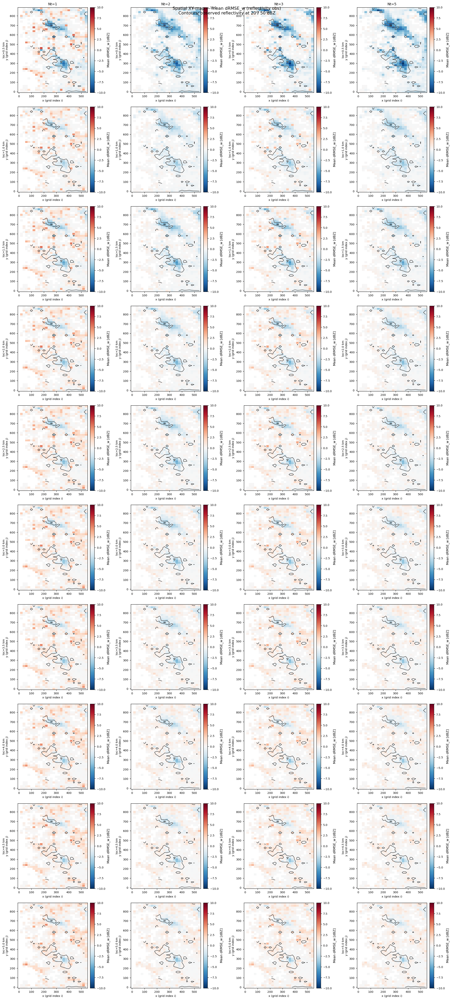

In [ ]:
stride = 20
vmin, vmax = -10, 10

fig, axes = plt.subplots(len(LOC_SCALES), len(FILTER_NTEMP),
                          figsize=(4.5 * len(FILTER_NTEMP),
                                   4 * len(LOC_SCALES)),
                          sharex=False, sharey=False)
fig.suptitle('Spatial XY map — mean dRMSE_w (reflectivity obs)\n'
             'Contours: observed reflectivity at 20 / 50 dBZ', fontsize=12)

### Observation data (max reflectivity across z levels at each xy bin)
i_idx_obs = (np.array(raw["i"]) / stride).astype(int)
j_idx_obs = (np.array(raw["j"]) / stride).astype(int)
k_idx_obs = np.array(raw["k"]).astype(int)

shape_obs = (i_idx_obs.max() + 1, j_idx_obs.max() + 1, k_idx_obs.max() + 1)
volume_obs = np.full(shape_obs, np.nan)
volume_obs[i_idx_obs, j_idx_obs, k_idx_obs] = raw["yo_clean"]
max_yo_2d = np.nanmax(volume_obs, axis=2)

i_real_coords = np.arange(shape_obs[0]) * stride
j_real_coords = np.arange(shape_obs[1]) * stride

norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm   = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)

for ri, loc in enumerate(LOC_SCALES):
    for ci, nt in enumerate(FILTER_NTEMP):
        ax  = axes[ri][ci]
        sub = df[(df['loc_scale'] == loc) & (df['ntemp'] == nt)]

        # Average drmse_w over truth members at each (i, j, k) bin
        i_idx_drmse = (np.array(sub["i"]) / stride).astype(int)
        j_idx_drmse = (np.array(sub["j"]) / stride).astype(int)
        k_idx_drmse = np.array(sub["k"]).astype(int)
        shape_drmse = (i_idx_drmse.max() + 1, j_idx_drmse.max() + 1, k_idx_drmse.max() + 1)

        # Accumulate mean over truth members
        acc = np.zeros(shape_drmse)
        cnt = np.zeros(shape_drmse, dtype=int)
        vals = np.array(sub["drmse_w"])
        np.add.at(acc, (i_idx_drmse, j_idx_drmse, k_idx_drmse), vals)
        np.add.at(cnt, (i_idx_drmse, j_idx_drmse, k_idx_drmse), 1)
        volume_drmse = np.where(cnt > 0, acc / cnt, np.nan)

        # Mean over vertical levels → 2D map
        max_drmse_2d = np.nanmean(volume_drmse, axis=2)

        # pcolormesh: x=i (east-west), y=j (north-south)
        # max_drmse_2d has shape (n_i, n_j) → transpose to (n_j, n_i) for pcolormesh
        ax.pcolormesh(i_real_coords, j_real_coords, max_drmse_2d.T,
                      cmap='RdBu_r', norm=norm, shading='auto')
        ax.contour(i_real_coords, j_real_coords, max_yo_2d.T,
                   levels=[20, 50], colors='black', linewidths=0.8, zorder=10)
        ax.contour(i_real_coords, j_real_coords, max_yo_2d.T,
                   levels=[20, 50], colors='white', linewidths=1.3, zorder=5)

        if ri == 0:
            ax.set_title(f'Nt={nt}', fontsize=10)
        ax.set_ylabel(f'loc={loc} km\ny (grid index j)', fontsize=8)
        ax.set_xlabel('x (grid index i)', fontsize=8)
        plt.colorbar(sm, ax=ax, orientation='vertical',
                     fraction=0.2, pad=0.03, label='Mean dRMSE_w [dBZ]')

plt.tight_layout()
plt.show()

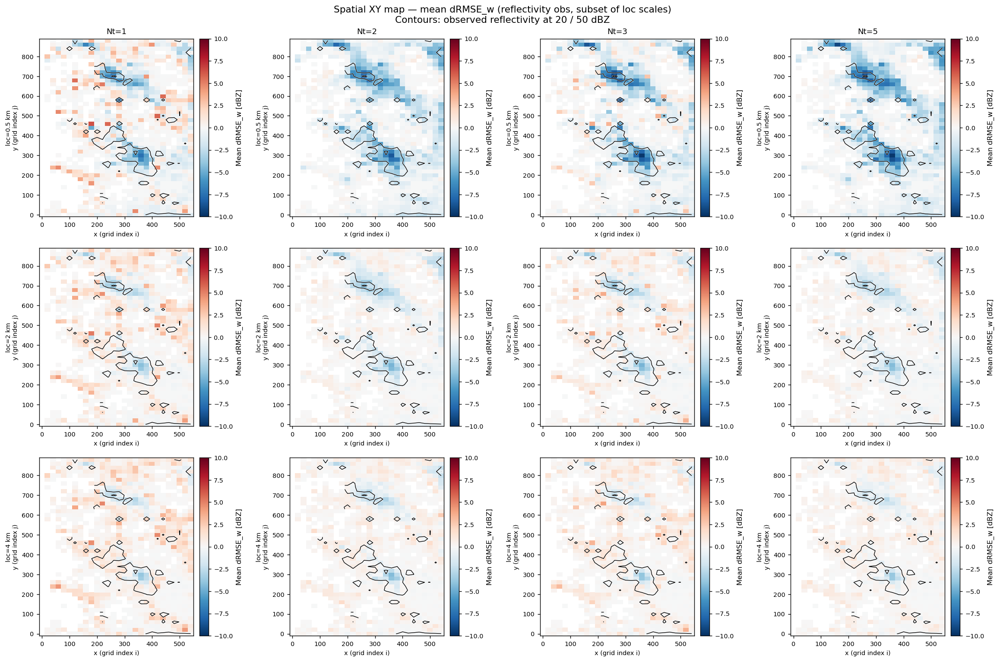

In [ ]:
stride = 20
vmin, vmax = -10, 10
LOC_SCALES_subset = [0.5, 2, 4]

fig, axes = plt.subplots(len(LOC_SCALES_subset), len(FILTER_NTEMP),
                          figsize=(4.5 * len(FILTER_NTEMP),
                                   4 * len(LOC_SCALES_subset)),
                          sharex=False, sharey=False)
fig.suptitle('Spatial XY map — mean dRMSE_w (reflectivity obs, subset of loc scales)\n'
             'Contours: observed reflectivity at 20 / 50 dBZ', fontsize=12)

### Observation data
i_idx_obs = (np.array(raw["i"]) / stride).astype(int)
j_idx_obs = (np.array(raw["j"]) / stride).astype(int)
k_idx_obs = np.array(raw["k"]).astype(int)

shape_obs = (i_idx_obs.max() + 1, j_idx_obs.max() + 1, k_idx_obs.max() + 1)
volume_obs = np.full(shape_obs, np.nan)
volume_obs[i_idx_obs, j_idx_obs, k_idx_obs] = raw["yo_clean"]
max_yo_2d = np.nanmax(volume_obs, axis=2)

i_real_coords = np.arange(shape_obs[0]) * stride
j_real_coords = np.arange(shape_obs[1]) * stride

norm = plt.Normalize(vmin=vmin, vmax=vmax)
sm   = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)

for ri, loc in enumerate(LOC_SCALES_subset):
    for ci, nt in enumerate(FILTER_NTEMP):
        ax  = axes[ri][ci]
        sub = df[(df['loc_scale'] == loc) & (df['ntemp'] == nt)]

        i_idx_drmse = (np.array(sub["i"]) / stride).astype(int)
        j_idx_drmse = (np.array(sub["j"]) / stride).astype(int)
        k_idx_drmse = np.array(sub["k"]).astype(int)
        shape_drmse = (i_idx_drmse.max() + 1, j_idx_drmse.max() + 1, k_idx_drmse.max() + 1)

        acc = np.zeros(shape_drmse)
        cnt = np.zeros(shape_drmse, dtype=int)
        vals = np.array(sub["drmse_w"])
        np.add.at(acc, (i_idx_drmse, j_idx_drmse, k_idx_drmse), vals)
        np.add.at(cnt, (i_idx_drmse, j_idx_drmse, k_idx_drmse), 1)
        volume_drmse = np.where(cnt > 0, acc / cnt, np.nan)

        max_drmse_2d = np.nanmean(volume_drmse, axis=2)

        ax.pcolormesh(i_real_coords, j_real_coords, max_drmse_2d.T,
                      cmap='RdBu_r', norm=norm, shading='auto')
        ax.contour(i_real_coords, j_real_coords, max_yo_2d.T,
                   levels=[20, 50], colors='black', linewidths=0.8, zorder=10)
        ax.contour(i_real_coords, j_real_coords, max_yo_2d.T,
                   levels=[20, 50], colors='white', linewidths=1.3, zorder=5)

        if ri == 0:
            ax.set_title(f'Nt={nt}', fontsize=10)
        ax.set_ylabel(f'loc={loc} km\ny (grid index j)', fontsize=8)
        ax.set_xlabel('x (grid index i)', fontsize=8)
        plt.colorbar(sm, ax=ax, orientation='vertical',
                     fraction=0.2, pad=0.03, label='Mean dRMSE_w [dBZ]')

plt.tight_layout()
plt.show()

## 5b. Spatial XY Maps — DRMSE for Each State Variable

Same layout as the dRMSE_w maps above, but for each WRF state variable (qg, qr, qs, T, P, u, v, w).
Columns are grouped as (metric_w | metric_u | metric_point) × ntemps.
Color scale is auto-scaled per variable using the 95th percentile of |dRMSE|.
Contours still show observed reflectivity at 20 / 50 dBZ.

In [ ]:
def build_obs_reference(df_ref, stride=20):
    """Build the 2D max-reflectivity reference map and coordinate arrays from any subset of df."""
    i_idx = (np.array(df_ref["i"]) / stride).astype(int)
    j_idx = (np.array(df_ref["j"]) / stride).astype(int)
    k_idx = np.array(df_ref["k"]).astype(int)
    shape = (i_idx.max() + 1, j_idx.max() + 1, k_idx.max() + 1)
    vol   = np.full(shape, np.nan)
    vol[i_idx, j_idx, k_idx] = df_ref["yo_clean"]
    max_yo_2d = np.nanmax(vol, axis=2)
    i_coords  = np.arange(shape[0]) * stride
    j_coords  = np.arange(shape[1]) * stride
    return i_coords, j_coords, max_yo_2d


def plot_spatial_drmse_variable(df_all, variable,
                                loc_scales_plot=None,
                                ntemps_plot=None,
                                metrics_plot=('w', 'u', 'point'),
                                stride=20,
                                i_coords=None, j_coords=None, max_yo_2d=None):
    """
    One figure per variable.
    Columns: metric groups (w | u | point), each containing all ntemps.
    Rows: loc_scales_plot.
    Color scale: symmetric, vmax = 95th pct of |dRMSE| across all metrics.
    """
    if loc_scales_plot is None:
        loc_scales_plot = [0.5, 2.0, 4.0]
    if ntemps_plot is None:
        ntemps_plot = FILTER_NTEMP

    # Build observation reference if not supplied
    if i_coords is None:
        ref_sub = df_all[df_all['loc_scale'] == loc_scales_plot[0]]
        i_coords, j_coords, max_yo_2d = build_obs_reference(ref_sub, stride)

    # Auto color scale: 95th pct of |drmse| across all metrics for this variable
    all_vals = []
    for metric in metrics_plot:
        col = f'drmse_{metric}_{variable}'
        if col in df_all.columns:
            v = df_all[col].dropna().values
            all_vals.append(np.abs(v))
    if all_vals:
        vmax = float(np.percentile(np.concatenate(all_vals), 95))
        vmax = max(vmax, 1e-10)
    else:
        vmax = 1.0
    norm = plt.Normalize(vmin=-vmax, vmax=vmax)
    sm   = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)

    n_cols = len(metrics_plot) * len(ntemps_plot)
    n_rows = len(loc_scales_plot)
    fig, axes = plt.subplots(n_rows, n_cols,
                              figsize=(3.5 * n_cols, 3.5 * n_rows),
                              sharex=False, sharey=False)
    if n_rows == 1:
        axes = axes[np.newaxis, :]
    if n_cols == 1:
        axes = axes[:, np.newaxis]

    fig.suptitle(f'Spatial XY map — mean dRMSE({variable})\n'
                 f'Columns: metric(w | u | point) × Nt; color scale: ±{vmax:.2e}',
                 fontsize=11)

    for ri, loc in enumerate(loc_scales_plot):
        for mi, metric in enumerate(metrics_plot):
            drmse_col = f'drmse_{metric}_{variable}'
            col_exists = drmse_col in df_all.columns
            for ni, nt in enumerate(ntemps_plot):
                ci = mi * len(ntemps_plot) + ni
                ax = axes[ri][ci]

                if col_exists:
                    sub = df_all[(df_all['loc_scale'] == loc) & (df_all['ntemp'] == nt)]
                    i_idx = (np.array(sub["i"]) / stride).astype(int)
                    j_idx = (np.array(sub["j"]) / stride).astype(int)
                    k_idx = np.array(sub["k"]).astype(int)
                    shp   = (i_idx.max() + 1, j_idx.max() + 1, k_idx.max() + 1)
                    acc   = np.zeros(shp)
                    cnt   = np.zeros(shp, dtype=int)
                    vals  = np.array(sub[drmse_col])
                    finite = np.isfinite(vals)
                    np.add.at(acc, (i_idx[finite], j_idx[finite], k_idx[finite]), vals[finite])
                    np.add.at(cnt, (i_idx[finite], j_idx[finite], k_idx[finite]), 1)
                    volume = np.where(cnt > 0, acc / cnt, np.nan)
                    map2d  = np.nanmean(volume, axis=2)

                    ax.pcolormesh(i_coords, j_coords, map2d.T,
                                  cmap='RdBu_r', norm=norm, shading='auto')
                    ax.contour(i_coords, j_coords, max_yo_2d.T,
                               levels=[20, 50], colors='black', linewidths=0.8, zorder=10)
                    ax.contour(i_coords, j_coords, max_yo_2d.T,
                               levels=[20, 50], colors='white', linewidths=1.3, zorder=5)
                else:
                    ax.text(0.5, 0.5, 'N/A', ha='center', va='center',
                            transform=ax.transAxes, fontsize=12, color='gray')

                if ri == 0:
                    ax.set_title(f'{metric} | Nt={nt}', fontsize=9)
                ax.set_ylabel(f'loc={loc} km\ny (j)', fontsize=8)
                ax.set_xlabel('x (i)', fontsize=8)
                plt.colorbar(sm, ax=ax, orientation='vertical',
                             fraction=0.2, pad=0.03)

    plt.tight_layout()
    plt.show()


print('plot_spatial_drmse_variable ready.')
print('build_obs_reference ready.')

plot_spatial_drmse_variable ready.
build_obs_reference ready.



--- qg ---


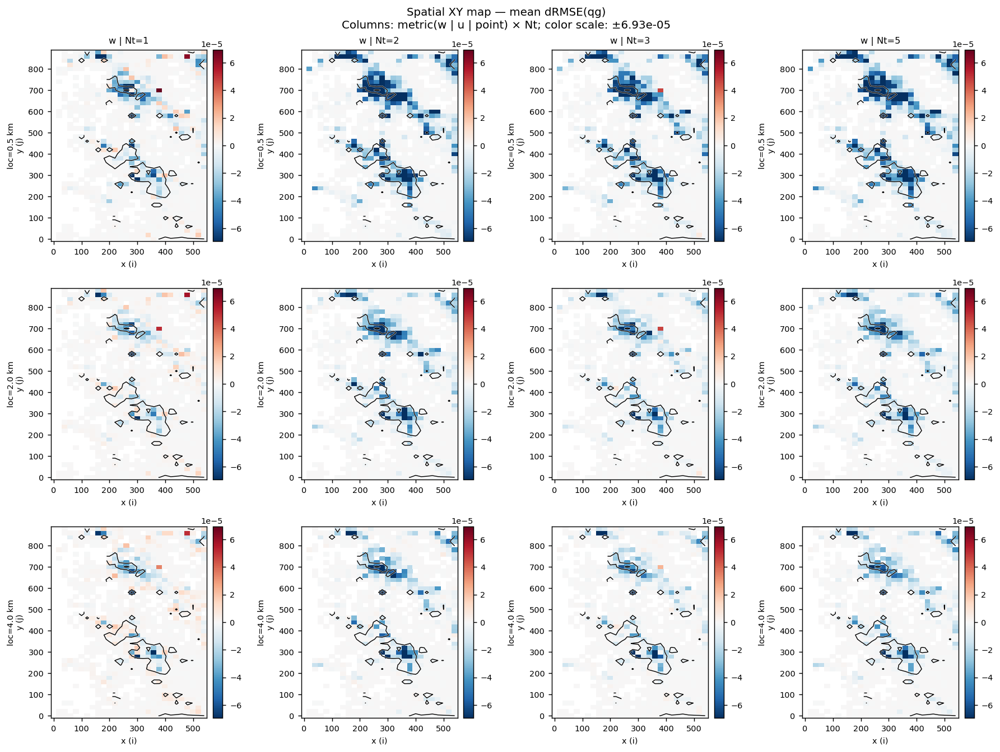


--- qr ---


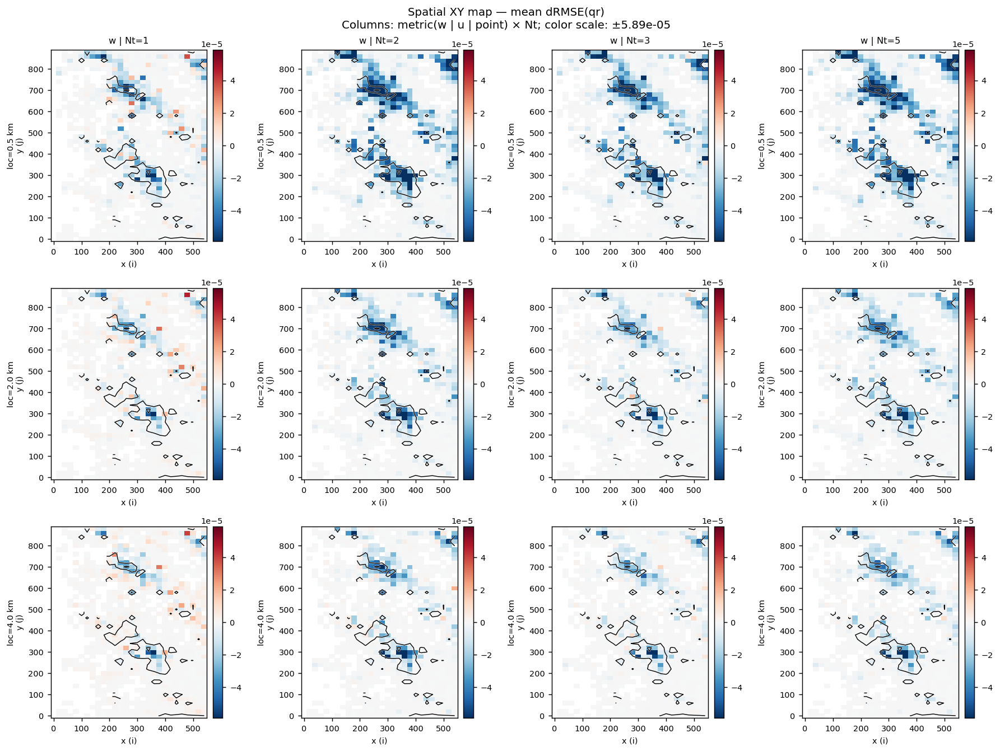


--- qs ---


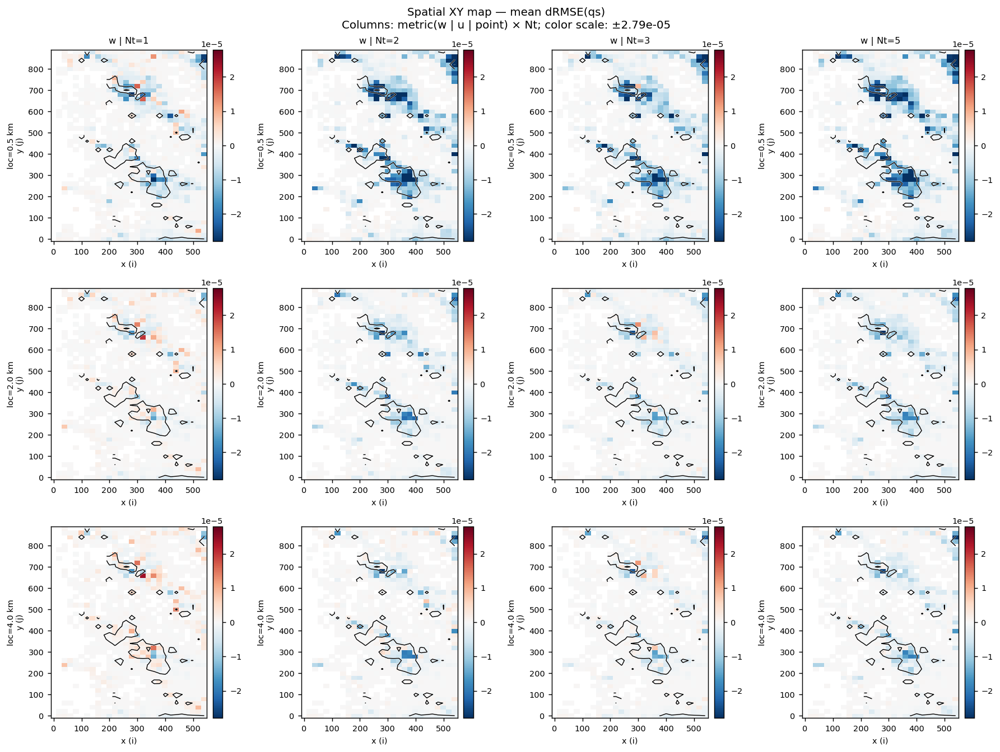


--- T ---


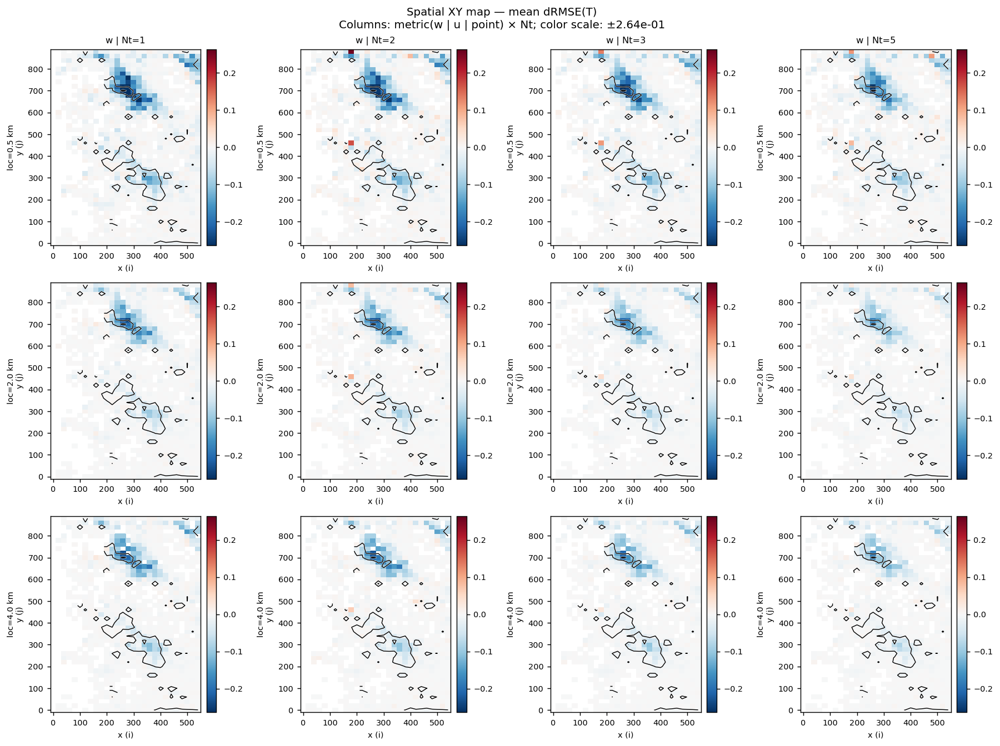


--- P ---


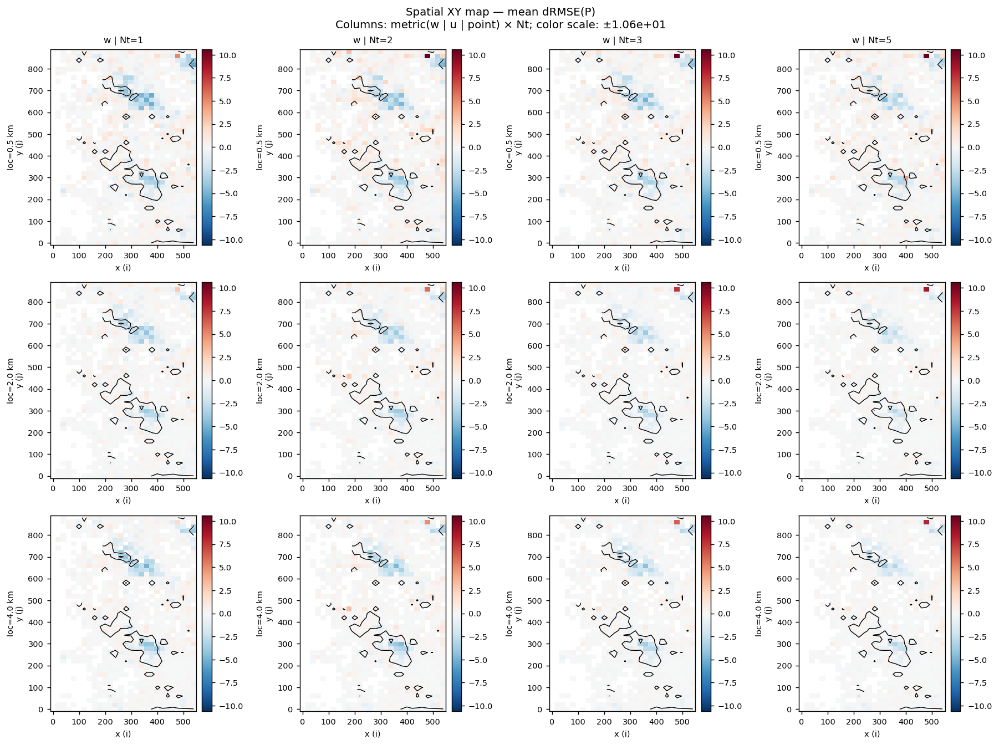


--- u ---


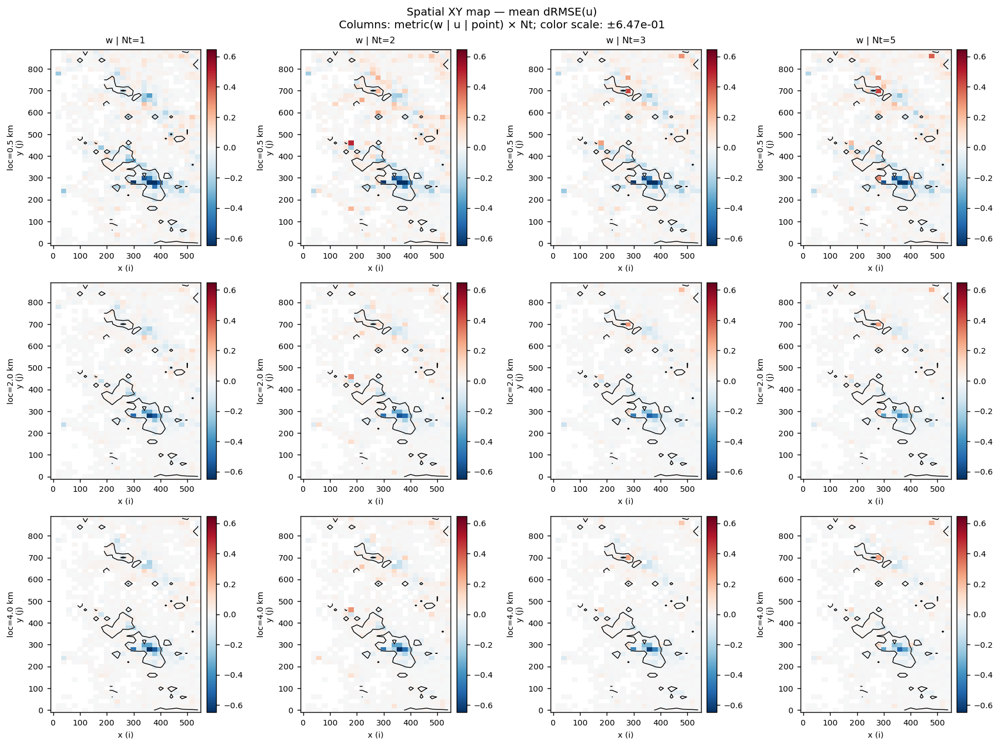


--- v ---


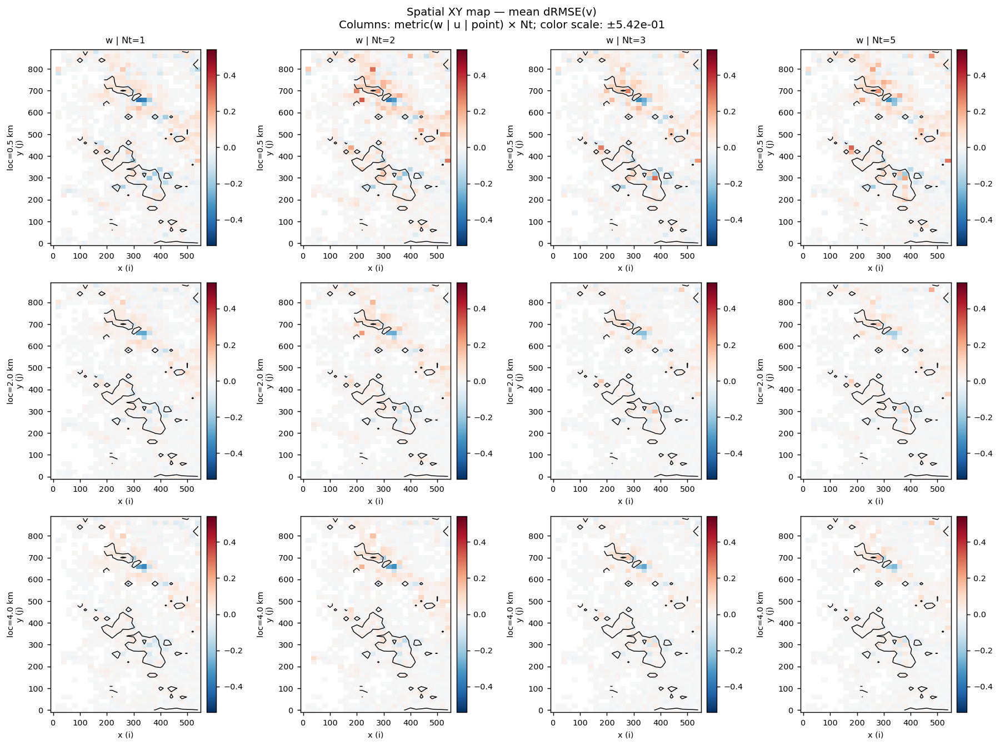


--- w ---


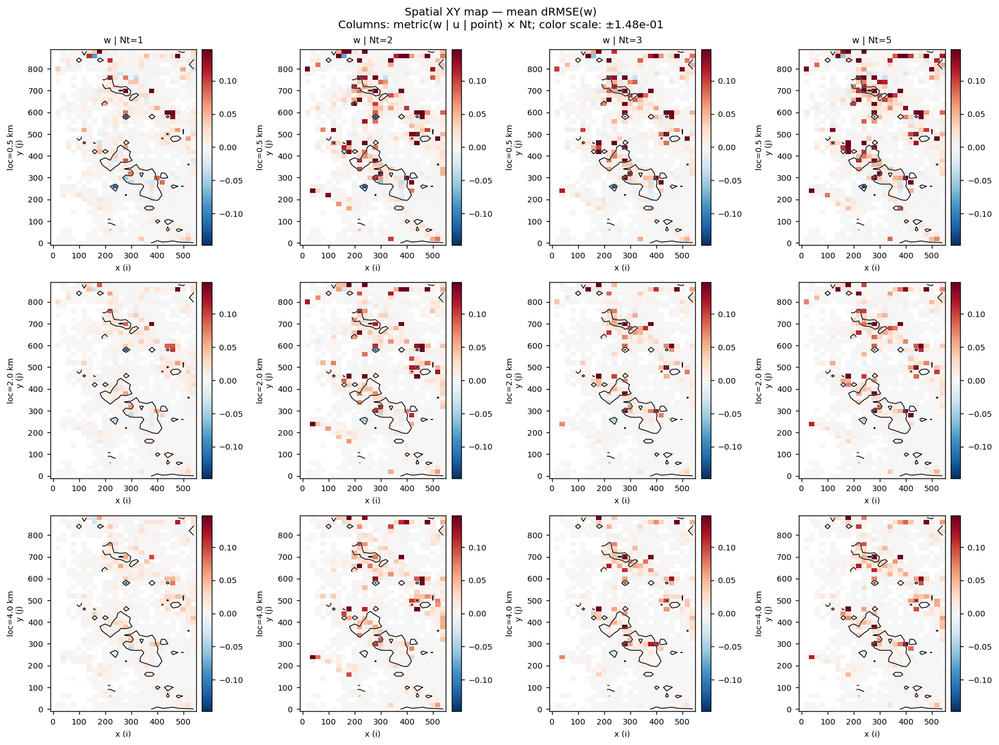

In [ ]:
# Build observation reference once (reused across all variable figures)
LOC_SCALES_MAPS = [0.5, 2.0, 4.0]   # subset of loc scales for per-variable maps
_ref_sub = df[df['loc_scale'] == LOC_SCALES_MAPS[0]]
_i_coords, _j_coords, _max_yo_2d = build_obs_reference(_ref_sub, stride=20)

STATE_VARS_PLOT = ['qg', 'qr', 'qs', 'T', 'P', 'u', 'v', 'w']

for var in STATE_VARS_PLOT:
    print(f'\n--- {var} ---')
    plot_spatial_drmse_variable(
        df, var,
        loc_scales_plot=LOC_SCALES_MAPS,
        ntemps_plot=FILTER_NTEMP,
        metrics_plot=('w'), #('w', 'u', 'point')
        stride=20,
        i_coords=_i_coords,
        j_coords=_j_coords,
        max_yo_2d=_max_yo_2d,
    )

## 9. Per-Variable RMSE Reduction

Which WRF state variables benefit most from each localization scale?

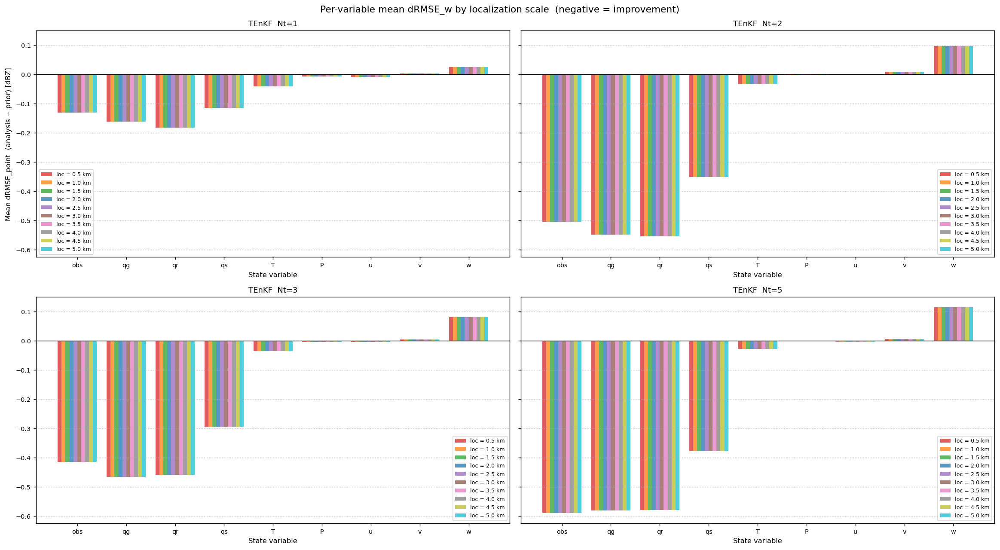

In [ ]:
VARS = ['obs','qg', 'qr', 'qs', 'T', 'P', 'u', 'v', 'w']

metric = 'point' # 'w', 'u', 'point'
# Verify columns exist
missing = [v for v in VARS
           if f'rmse_f_{metric}_{v}' not in df.columns or f'rmse_a_{metric}_{v}' not in df.columns]
if missing:
    print(f'WARNING: per-variable columns missing for: {missing}')
    VARS = [v for v in VARS if v not in missing]

n_vars    = len(VARS)
bar_width = 0.08
offsets   = np.linspace(-(len(LOC_SCALES) - 1) / 2,
                         (len(LOC_SCALES) - 1) / 2,
                         len(LOC_SCALES)) * bar_width

fig, axes = plt.subplots(2, 2,
                          figsize=(4.5 * len(FILTER_NTEMP), 10),
                          sharey=True)
fig.suptitle('Per-variable mean dRMSE_w by localization scale  (negative = improvement)', fontsize=12)
axes = axes.flatten()
for ax, nt in zip(axes, FILTER_NTEMP):
    sub_nt = df[df['ntemp'] == nt]
    x = np.arange(n_vars)

    for oi, loc in enumerate(LOC_SCALES):
        sub = sub_nt[sub_nt['loc_scale'] == loc]
        delta_means = [
            (sub[f'rmse_a_{metric}_{v}'] - sub[f'rmse_f_{metric}_{v}']).mean()/sub[f'rmse_f_{metric}_{v}'].mean()
            for v in VARS
        ]
        ax.bar(x + offsets[oi], delta_means,
               width=bar_width, color=LOC_COLORS[loc],
               alpha=0.75, label=LOC_LABELS[loc])

    ax.axhline(0, color='k', linewidth=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(VARS)
    ax.set_title(f'TEnKF  Nt={nt}')
    ax.set_xlabel('State variable')
    ax.legend(fontsize=7)
    ax.grid(True, linestyle=':', alpha=0.9, axis='y')

axes[0].set_ylabel(f'Mean dRMSE_{metric}  (analysis − prior) [dBZ]')
plt.tight_layout()
plt.show()

## 6. Benefit of Tempering per Localization Scale

Does extra tempering (Nt > 1) help more at smaller localization scales?

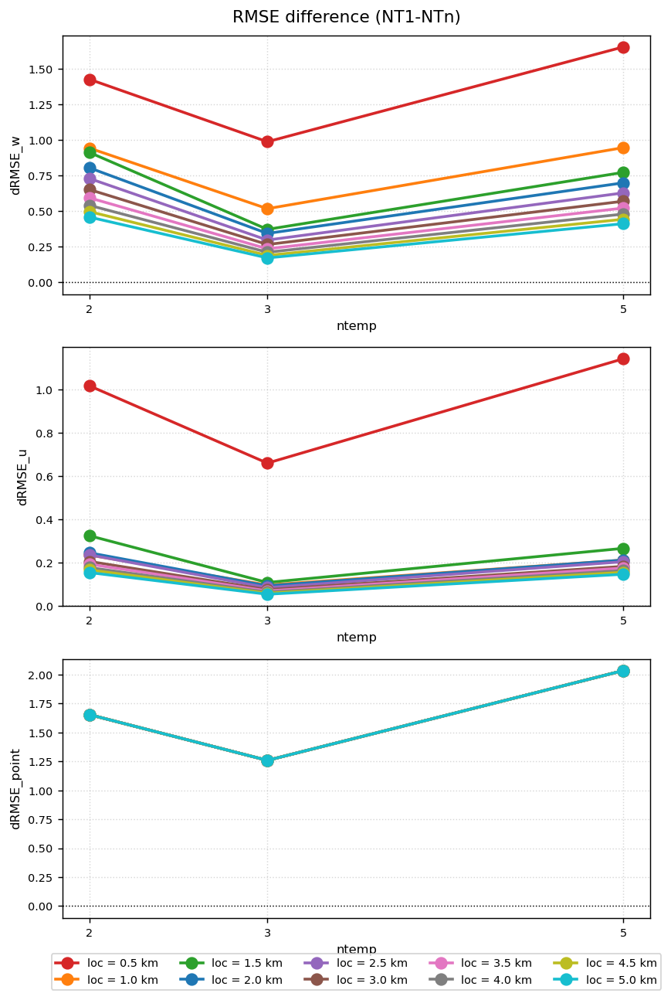

In [ ]:
compare_ntemp = [2, 3, 5]
metrics = ['w', 'u', 'point'] # 'w', 'u', 'point'
fig, axs = plt.subplots(3,1, figsize=(7, 10))

for ax, metric in zip(axs, metrics):
    for loc in LOC_SCALES:
        sub_loc = df[df['loc_scale'] == loc]
        ref1 = sub_loc[sub_loc['ntemp'] == 1]['rmse_a_' + metric + '_obs'].mean()

        gains = []
        for nt in compare_ntemp:
            ref_n = sub_loc[sub_loc['ntemp'] == nt]['rmse_a_' + metric + '_obs'].mean()
            gains.append(ref1 - ref_n)   # positive = Nt=n better than Nt=1

        ax.plot(compare_ntemp, gains,
                color=LOC_COLORS[loc], marker='o', markersize=8,
                linewidth=2, label=LOC_LABELS[loc])

    ax.axhline(0, color='k', linewidth=0.8, linestyle=':')
    #ax.set_title('RMSE gain of Nt=n over Nt=1 per localization scale\n'
    #             '(positive = more tempering helps)')
    ax.set_xlabel('ntemp')
    ax.set_ylabel(f'dRMSE_{metric}')
    ax.set_xticks(compare_ntemp)
    ax.grid(True, linestyle=':', alpha=0.5)
# one legend for all the subplots in a external axe below the subplots
plt.suptitle('RMSE difference (NT1-NTn)')
plt.legend(loc='lower center', ncol = 5, bbox_to_anchor=(0.5, -0.3))

plt.tight_layout()
plt.show()

## 11. Summary Statistics Table

In [ ]:
metric_cols = [
    ('dep_b',         'Prior O-B [dBZ]'),
    ('dep_a',         'Analysis O-A [dBZ]'),
    ('rmse_f_w_obs',  'Prior RMSE_w [dBZ]'),
    ('rmse_a_w_obs',  'Analysis RMSE_w [dBZ]'),
    ('drmse_w',       'dRMSE_w [dBZ]'),
    ('rmse_f_u_obs',  'Prior RMSE_u [dBZ]'),
    ('rmse_a_u_obs',  'Analysis RMSE_u [dBZ]'),
    ('spread_f_obs',  'Prior spread [dBZ]'),
    ('spread_a_obs',  'Analysis spread [dBZ]'),
]

rows = []
for loc in LOC_SCALES:
    for nt in FILTER_NTEMP:
        sub = df[(df['loc_scale'] == loc) & (df['ntemp'] == nt)]
        row = {'loc_scale': f'{loc} km', 'ntemp': nt}
        for col, lbl in metric_cols:
            if col in sub.columns:
                v = sub[col].dropna()
                row[lbl] = f'{v.mean():.3f} ± {v.std():.3f}'
            else:
                row[lbl] = 'N/A'
        rows.append(row)

tbl = pd.DataFrame(rows).set_index(['loc_scale', 'ntemp'])
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
display(tbl)

Prior O-B [dBZ] Analysis O-A [dBZ] Prior RMSE_w [dBZ] Analysis RMSE_w [dBZ]   dRMSE_w [dBZ] Prior RMSE_u [dBZ] Analysis RMSE_u [dBZ] Prior spread [dBZ] Analysis spread [dBZ]
loc_scale ntemp                                                                                                                                                                              
0.5 km    1       0.701 ± 8.288     -2.579 ± 5.450      4.525 ± 7.051         4.254 ± 5.640  -0.271 ± 6.660      4.605 ± 7.005         4.605 ± 5.979      7.039 ± 4.609         4.355 ± 3.053
          2       0.701 ± 8.288     -0.036 ± 4.035      4.525 ± 7.051         2.827 ± 4.102  -1.698 ± 5.187      4.605 ± 7.005         3.590 ± 5.276      7.039 ± 4.609         3.977 ± 2.579
          3       0.701 ± 8.288     -1.251 ± 4.576      4.525 ± 7.051         3.266 ± 4.894  -1.259 ± 6.221      4.605 ± 7.005         3.947 ± 5.653      7.039 ± 4.609         3.495 ± 2.180
          5       0.701 ± 8.288     -0.297 ± 3.367      4.525 ± 7.051         2.600 ± 3.853  -1.925 ± 5.350      4.605 ± 7.005         3.465 ± 5.209      7.039 ± 4.609         3.347 ± 1.899
1.0 km    1       0.701 ± 8.287     -2.579 ± 5.450      4.785 ± 6.874         5.042 ± 5.759   0.257 ± 4.150      5.003 ± 6.714         5.165 ± 6.429      7.039 ± 4.609         4.355 ± 3.053
          2       0.701 ± 8.287     -0.036 ± 4.035      4.785 ± 6.874         4.098 ± 5.092  -0.686 ± 2.805      5.003 ± 6.714         4.931 ± 6.427      7.039 ± 4.609         3.977 ± 2.579
          3       0.701 ± 8.287     -1.251 ± 4.576      4.785 ± 6.874         4.524 ± 5.521  -0.261 ± 3.736      5.003 ± 6.714         5.069 ± 6.450      7.039 ± 4.609         3.495 ± 2.180
          5       0.701 ± 8.287     -0.297 ± 3.367      4.785 ± 6.874         4.095 ± 5.125  -0.689 ± 2.965      5.003 ± 6.714         4.954 ± 6.447      7.039 ± 4.609         3.347 ± 1.899
1.5 km    1       0.701 ± 8.288     -2.579 ± 5.450      4.968 ± 6.738         5.173 ± 5.650   0.205 ± 4.686      5.207 ± 6.556         5.433 ± 6.138      7.039 ± 4.609         4.355 ± 3.053
          2       0.701 ± 8.288     -0.036 ± 4.035      4.968 ± 6.738         4.261 ± 4.814  -0.707 ± 3.408      5.207 ± 6.556         5.109 ± 6.081      7.039 ± 4.609         3.977 ± 2.579
          3       0.701 ± 8.288     -1.251 ± 4.576      4.968 ± 6.738         4.801 ± 5.525  -0.168 ± 4.351      5.207 ± 6.556         5.325 ± 6.174      7.039 ± 4.609         3.495 ± 2.180
          5       0.701 ± 8.288     -0.297 ± 3.367      4.968 ± 6.738         4.401 ± 5.088  -0.567 ± 3.577      5.207 ± 6.556         5.168 ± 6.148      7.039 ± 4.609         3.347 ± 1.899
2.0 km    1       0.701 ± 8.288     -2.579 ± 5.450      5.109 ± 6.628         5.494 ± 5.768   0.385 ± 4.156      5.370 ± 6.424         5.599 ± 6.131      7.039 ± 4.609         4.355 ± 3.053
          2       0.701 ± 8.288     -0.036 ± 4.035      5.109 ± 6.628         4.689 ± 5.114  -0.420 ± 2.993      5.370 ± 6.424         5.354 ± 6.105      7.039 ± 4.609         3.977 ± 2.579
          3       0.701 ± 8.288     -1.251 ± 4.576      5.109 ± 6.628         5.149 ± 5.649   0.041 ± 3.864      5.370 ± 6.424         5.506 ± 6.152      7.039 ± 4.609         3.495 ± 2.180
          5       0.701 ± 8.288     -0.297 ± 3.367      5.109 ± 6.628         4.794 ± 5.306  -0.315 ± 3.196      5.370 ± 6.424         5.387 ± 6.138      7.039 ± 4.609         3.347 ± 1.899
2.5 km    1       0.701 ± 8.287     -2.579 ± 5.450      5.227 ± 6.536         5.656 ± 5.786   0.429 ± 4.171      5.487 ± 6.314         5.734 ± 6.015      7.039 ± 4.609         4.355 ± 3.053
          2       0.701 ± 8.287     -0.036 ± 4.035      5.227 ± 6.536         4.927 ± 5.170  -0.300 ± 3.095      5.487 ± 6.314         5.499 ± 5.977      7.039 ± 4.609         3.977 ± 2.579
          3       0.701 ± 8.287     -1.251 ± 4.576      5.227 ± 6.536         5.359 ± 5.681   0.132 ± 3.889      5.487 ± 6.314         5.650 ± 6.037      7.039 ± 4.609         3.495 ± 2.180
          5       0.701 ± 